---
# ***Transaction Anomaly Detection and Analysis***
#### ***Using multiple ML models with focus on explainability and geospatial features***
---
##### *https://github.com/antodp*
---
# **Objective**

This project focuses on detecting anomalies - and potential frauds - in transactions within a dataset of 2,500+ records using a combination of machine learning and statistical techniques, from the point of view of a seller that wants to apply a monitoring layer to their user transactions. It employs four distinct anomaly detection methods, aggregating their results to pinpoint high-risk transactions. The project is designed to deliver actionable insights through comprehensive analysis, robust visualizations, and clear reporting.

After preprocessing the dataset (handling missing values, normalizing numeric features, and defining categorical columns), univariate, bivariate, and multivariate analyses were conducted to understand feature distributions and relationships. These analyses were visualized using appropriate graphs to provide clarity and context.
Particular focus was given to **geospatial identification** of categorical variables such as the declared location of the user conducting a transaction, and the actual IP address.

A combination of the following methodologies was employed:
1. **K-Means Clustering:** Identifies anomalies based on distance from centroids.
2. **Z-Score Analysis:** Flags extreme outliers in numeric features.
3. **Isolation Forest:** Highlights anomalous transactions using tree-based partitioning.
4. **Logistic Regression:** Finally classifies transactions as anomaly/non-anomaly using supervised learning, significantly contributing to the interpretability of the project results through a **LIME (Local Interpretable Model-Agnostic Explanations)** implementation.

The results from these methods were consolidated into a Fraud Risk Score, providing a continuous metric that reflects the likelihood of fraud for each transaction. This score combines model outputs and is used to prioritize high-risk transactions. The top 20 high-risk transactions were displayed in a color-coded chart, with individual results for each method and the consolidated fraud list saved in CSV format for further analysis.

This framework is scalable and can be integrated into real-time anomaly detection systems, offering flexibility and efficiency for processing larger datasets and addressing transactions of interest with a data-driven risk management approach.


*This model runs on Python 3.13 and performs best as a Jupyter Notebook.*

# **Load Data**
### Import suitable libraries. Fetch, scan and display relevant data 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
# Load the dataset
file_path = "../data/bank_transactions_data_2.csv"
data = pd.read_csv(file_path)

# Display initial information about the dataset
print(data.head())      # Preview first few rows
print(data.info())      # Structure and types of data
print(data.describe())  # Summary statistics for numerical columns

  TransactionID AccountID  TransactionAmount      TransactionDate  \
0      TX000001   AC00128              14.09  2023-04-11 16:29:14   
1      TX000002   AC00455             376.24  2023-06-27 16:44:19   
2      TX000003   AC00019             126.29  2023-07-10 18:16:08   
3      TX000004   AC00070             184.50  2023-05-05 16:32:11   
4      TX000005   AC00411              13.45  2023-10-16 17:51:24   

  TransactionType   Location DeviceID      IP Address MerchantID Channel  \
0           Debit  San Diego  D000380  162.198.218.92       M015     ATM   
1           Debit    Houston  D000051     13.149.61.4       M052     ATM   
2           Debit       Mesa  D000235  215.97.143.157       M009  Online   
3           Debit    Raleigh  D000187  200.13.225.150       M002  Online   
4          Credit    Atlanta  D000308    65.164.3.100       M091  Online   

   CustomerAge CustomerOccupation  TransactionDuration  LoginAttempts  \
0           70             Doctor                   81 

In [2]:
data = data.drop(columns=['AccountBalance']) # we drop AccountBalance because we are from a seller POV
data.head(20) # first rows

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,PreviousTransactionDate
0,TX000001,AC00128,14.09,2023-04-11 16:29:14,Debit,San Diego,D000380,162.198.218.92,M015,ATM,70,Doctor,81,1,2024-11-04 08:08:08
1,TX000002,AC00455,376.24,2023-06-27 16:44:19,Debit,Houston,D000051,13.149.61.4,M052,ATM,68,Doctor,141,1,2024-11-04 08:09:35
2,TX000003,AC00019,126.29,2023-07-10 18:16:08,Debit,Mesa,D000235,215.97.143.157,M009,Online,19,Student,56,1,2024-11-04 08:07:04
3,TX000004,AC00070,184.50,2023-05-05 16:32:11,Debit,Raleigh,D000187,200.13.225.150,M002,Online,26,Student,25,1,2024-11-04 08:09:06
4,TX000005,AC00411,13.45,2023-10-16 17:51:24,Credit,Atlanta,D000308,65.164.3.100,M091,Online,26,Student,198,1,2024-11-04 08:06:39
5,TX000006,AC00393,92.15,2023-04-03 17:15:01,Debit,Oklahoma City,D000579,117.67.192.211,M054,ATM,18,Student,172,1,2024-11-04 08:06:36
6,TX000007,AC00199,7.08,2023-02-15 16:36:48,Credit,Seattle,D000241,140.212.253.222,M019,ATM,37,Doctor,139,1,2024-11-04 08:10:09
7,TX000008,AC00069,171.42,2023-05-08 17:47:59,Credit,Indianapolis,D000500,92.214.76.157,M020,Branch,67,Retired,291,1,2024-11-04 08:10:55
8,TX000009,AC00135,106.23,2023-03-21 16:59:46,Credit,Detroit,D000690,24.148.92.177,M035,Branch,51,Engineer,86,1,2024-11-04 08:11:14
9,TX000010,AC00385,815.96,2023-03-31 16:06:57,Debit,Nashville,D000199,32.169.88.41,M007,ATM,55,Doctor,120,1,2024-11-04 08:06:32


# **Clean Data**
### Scan the dataset, check for missing values, fill in the missing values or delete them if too many NaN values

In [3]:
# Check for missing values
print("Missing values:\n", data.isnull().sum())

# Fill or drop missing values (example: fill missing numeric columns with median)
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
data[numeric_columns] = data[numeric_columns].fillna(data[numeric_columns].median())

# Handle categorical data (example: fill missing with mode)
categorical_columns = data.select_dtypes(include=['object']).columns
for col in categorical_columns:
    data[col] = data[col].fillna(data[col].mode()[0])

# Convert date columns to datetime format (if applicable)
if 'date' in data.columns:
    data['date'] = pd.to_datetime(data['date'])

# Select only numeric columns
numeric_data = data.select_dtypes(include=['float64', 'int64'])

# Drop columns with too many missing values (optional)
numeric_data = numeric_data.dropna(axis=1, thresh=len(numeric_data) * 0.5)  # Keep columns with >50% non-NaN values

# Fill remaining missing values with median (optional)
numeric_data = numeric_data.fillna(numeric_data.median())

Missing values:
 TransactionID              0
AccountID                  0
TransactionAmount          0
TransactionDate            0
TransactionType            0
Location                   0
DeviceID                   0
IP Address                 0
MerchantID                 0
Channel                    0
CustomerAge                0
CustomerOccupation         0
TransactionDuration        0
LoginAttempts              0
PreviousTransactionDate    0
dtype: int64


---
# **Exploratory Data Analysis (EDA)**
---

## **1. Univariate Analysis**
### Focus on analyzing a single feature at a time to understand its distribution, central tendency, and variability. Visualized with histograms, boxplots and countplots

Correlation Matrix:
                     TransactionAmount  CustomerAge  TransactionDuration  \
TransactionAmount             1.000000    -0.025616             0.004359   
CustomerAge                  -0.025616     1.000000            -0.017936   
TransactionDuration           0.004359    -0.017936             1.000000   
LoginAttempts                -0.008445     0.007653             0.032639   

                     LoginAttempts  
TransactionAmount        -0.008445  
CustomerAge               0.007653  
TransactionDuration       0.032639  
LoginAttempts             1.000000  


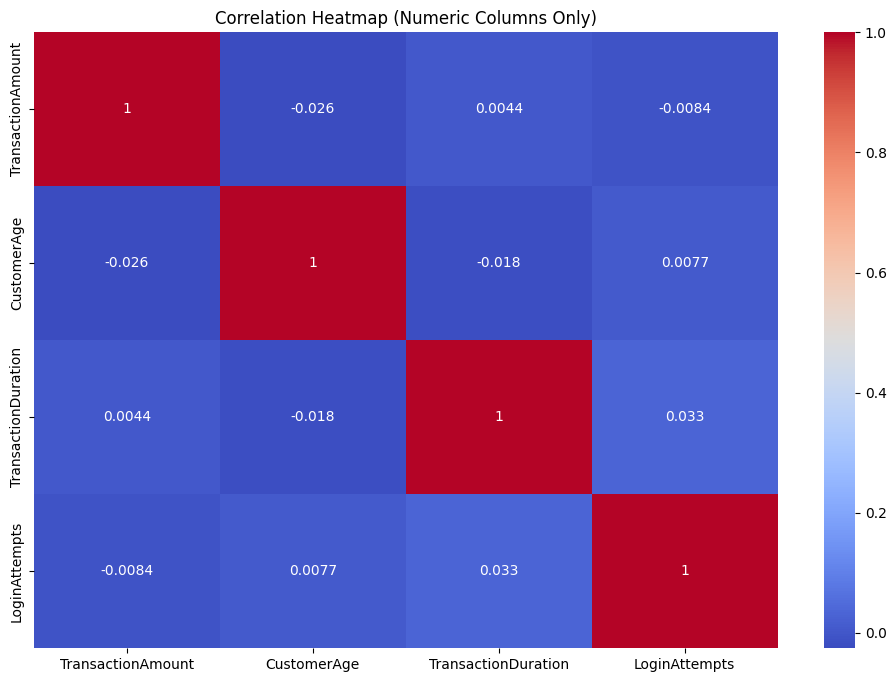

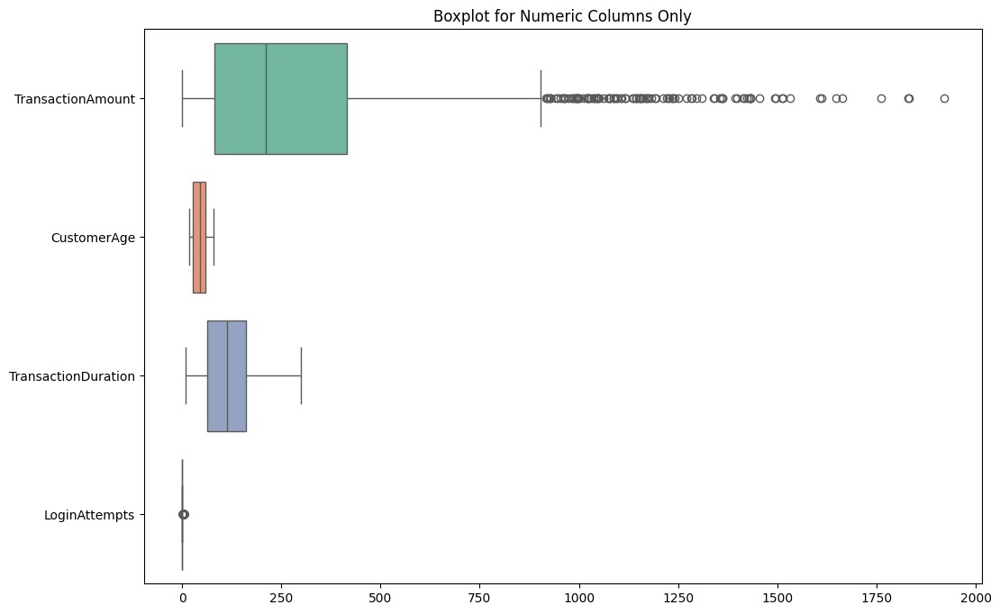

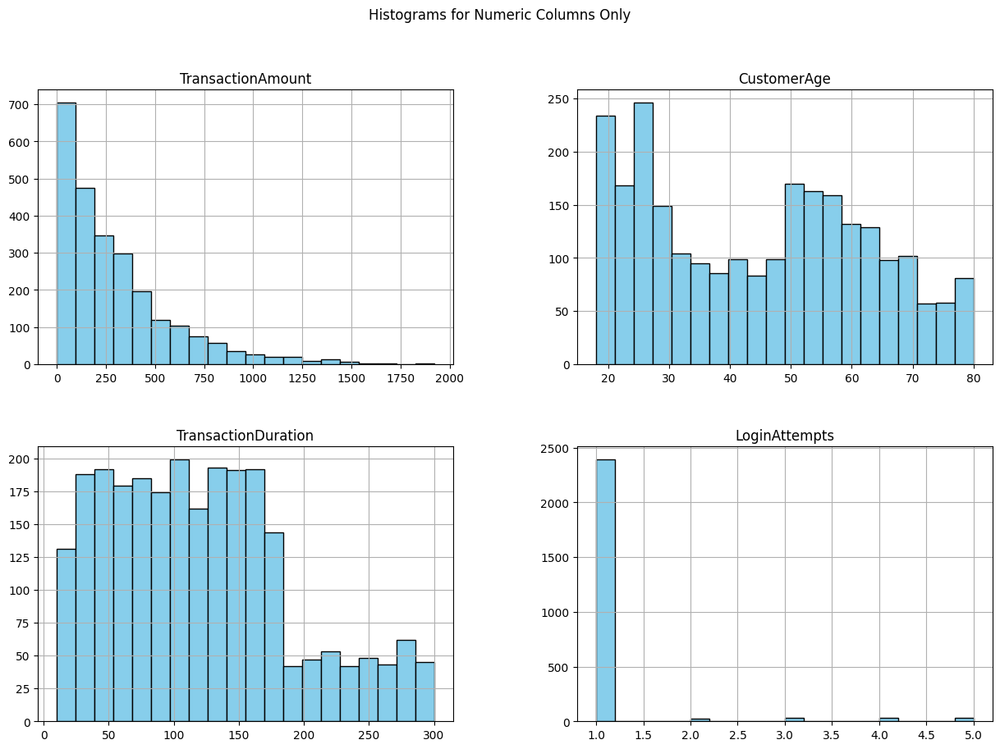

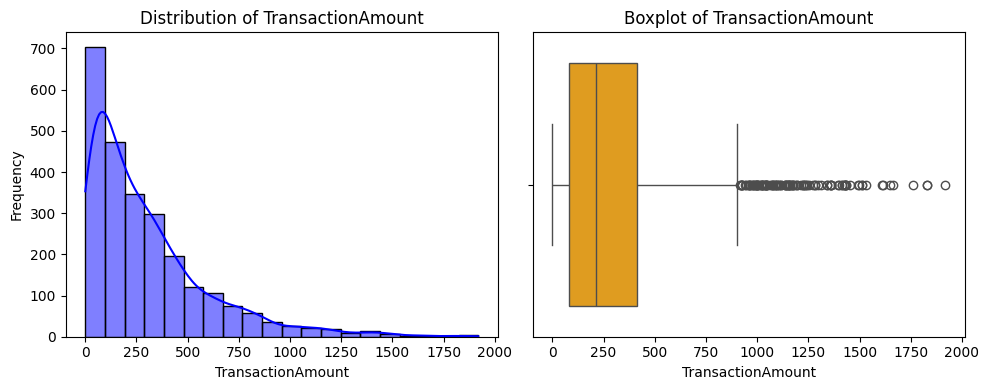

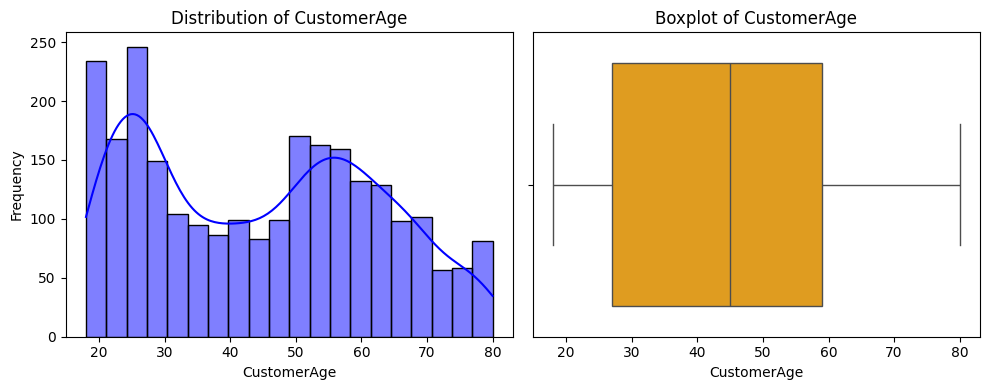

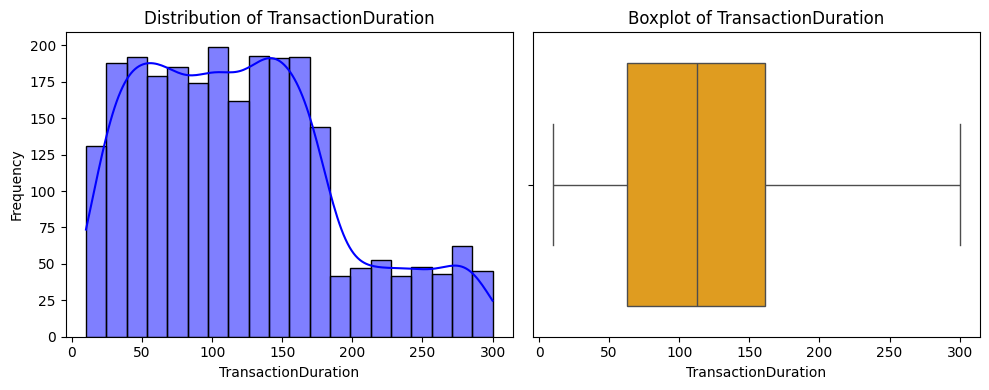

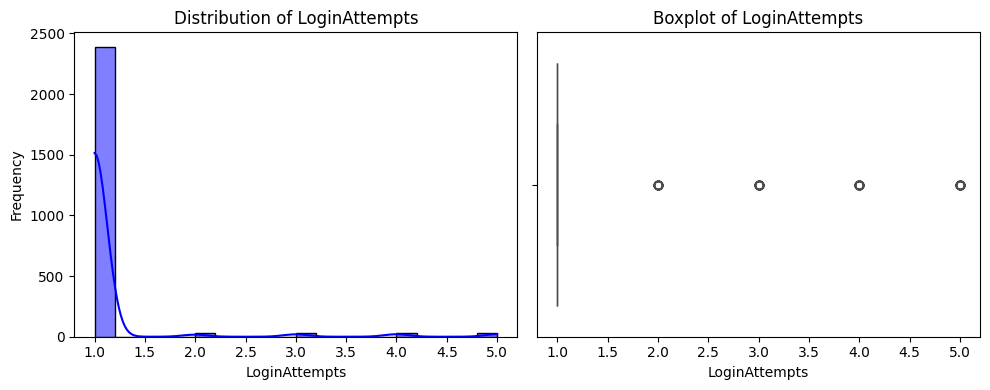

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/4275547168.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=data['Location'], order=data['Location'].value_counts().index, palette='viridis')


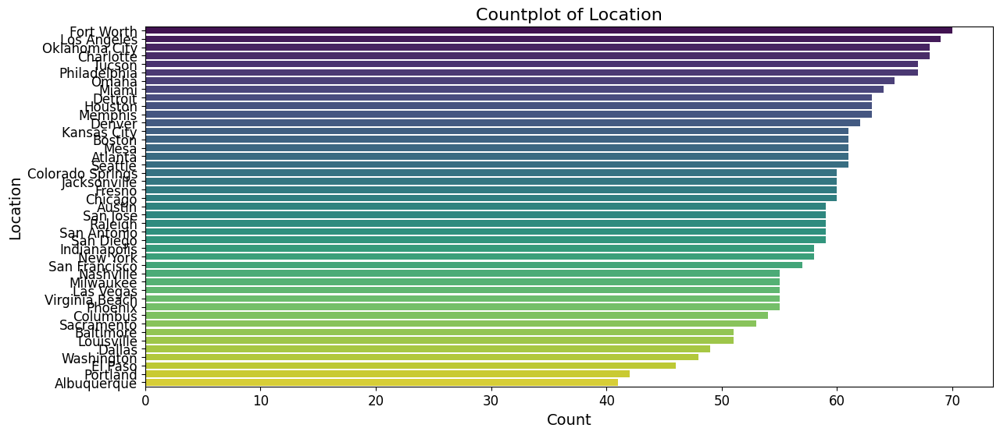

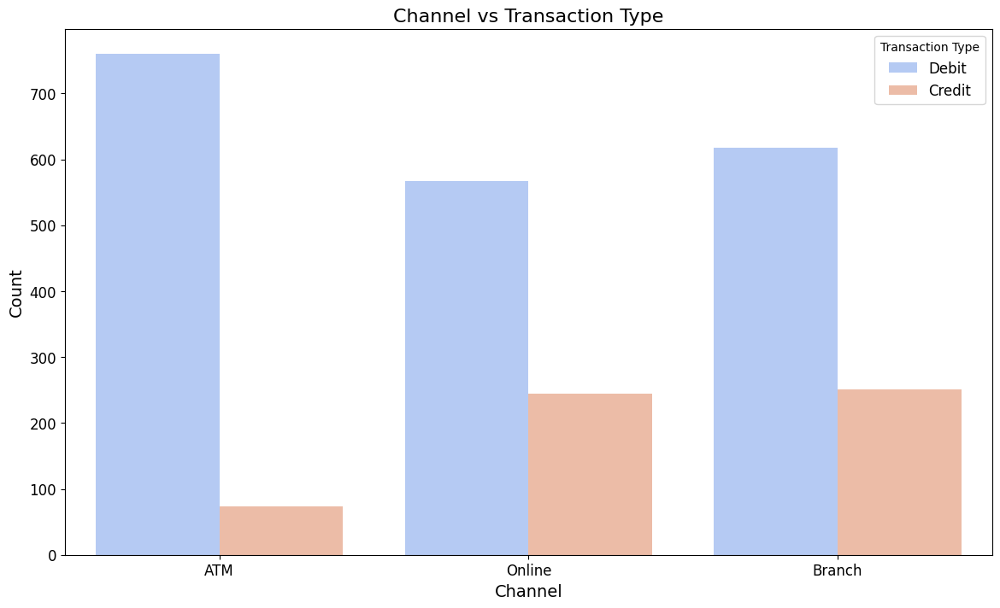

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/4275547168.py:75: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='CustomerOccupation', y='CustomerAge', data=data, estimator='mean', palette='muted', ci=None)
/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/4275547168.py:75: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='CustomerOccupation', y='CustomerAge', data=data, estimator='mean', palette='muted', ci=None)


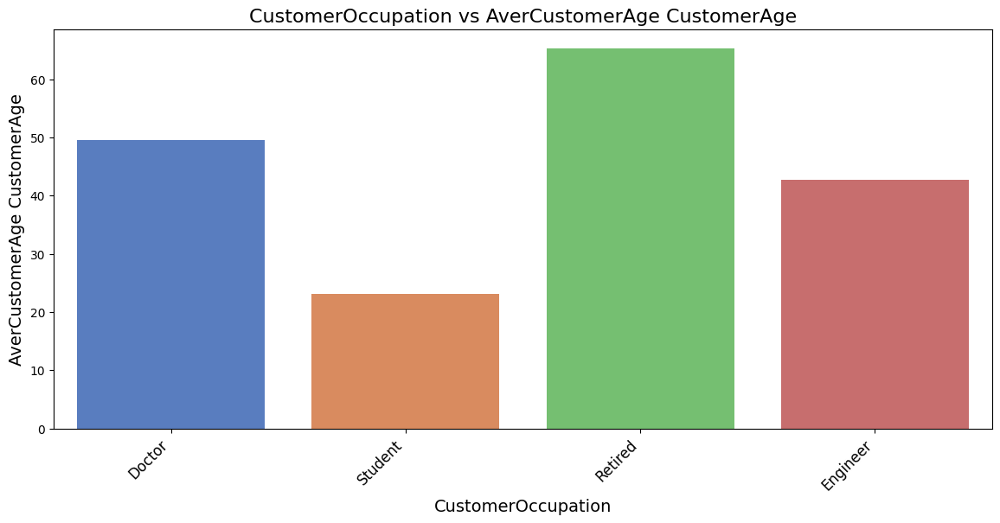

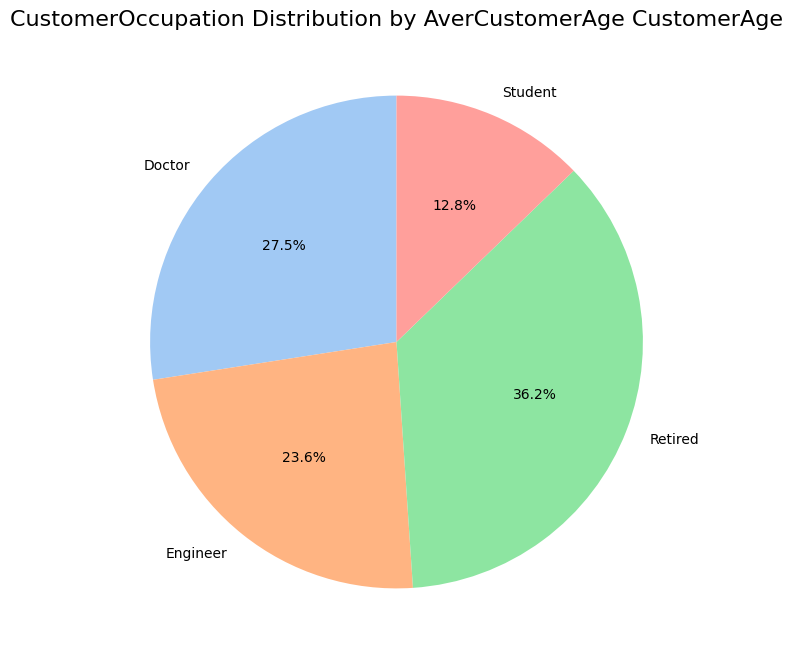

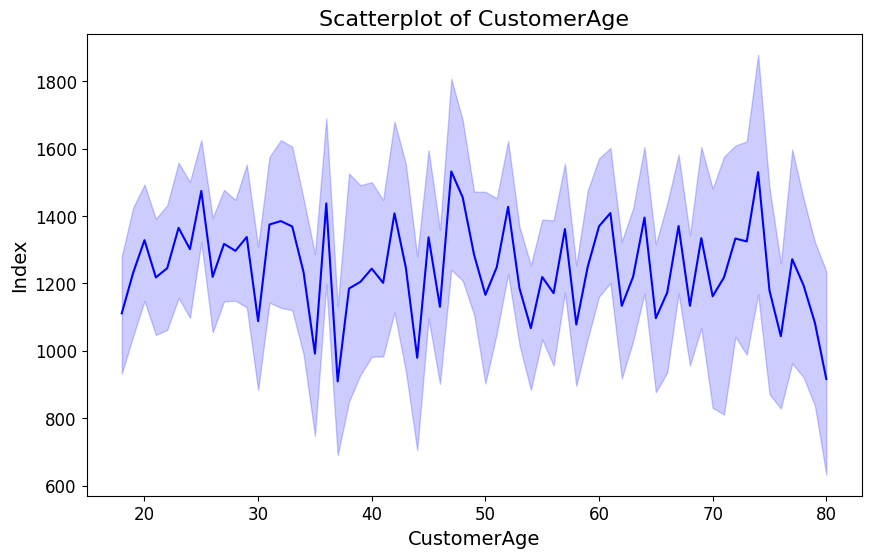

In [4]:
# Compute the correlation matrix for numeric data only
correlation_matrix = numeric_data.corr()

# Verify the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

# Plot the heatmap
plt.figure(figsize=(12, 8))  # Adjust figure size
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap (Numeric Columns Only)')
plt.show()

# Additional: Boxplot for numeric columns only
plt.figure(figsize=(12, 8))
sns.boxplot(data=numeric_data, orient="h", palette="Set2")
plt.title('Boxplot for Numeric Columns Only')
plt.show()

# Additional: Histograms for numeric columns only
numeric_data.hist(figsize=(15, 10), bins=20, edgecolor='black', color='skyblue')
plt.suptitle('Histograms for Numeric Columns Only')
plt.show()

# Step 1: Identify numeric and categorical columns
numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = data.select_dtypes(include=['object', 'category']).columns

# Step 2: Plot univariate graphs
# For numeric columns: Histograms and Boxplots
for col in numeric_cols:
    plt.figure(figsize=(10, 4))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data[col], kde=True, bins=20, color='blue', edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=data[col], color='orange')
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()

# For categorical columns: Countplots
# Countplot for 'location'
plt.figure(figsize=(14, 6))
sns.countplot(y=data['Location'], order=data['Location'].value_counts().index, palette='viridis')
plt.title('Countplot of Location', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Location', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

# Double bar graph for 'Channel' and 'TransactionType'
plt.figure(figsize=(14, 8))
sns.countplot(x='Channel', hue='TransactionType', data=data, palette='coolwarm')
plt.title('Channel vs Transaction Type', fontsize=16)
plt.xlabel('Channel', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Transaction Type', fontsize=12)
plt.show()


# Bar graph and pie chart for 'CustomerOccupation' with respect to 'CustomerAge'
plt.figure(figsize=(14, 6))
sns.barplot(x='CustomerOccupation', y='CustomerAge', data=data, estimator='mean', palette='muted', ci=None)
plt.title('CustomerOccupation vs AverCustomerAge CustomerAge', fontsize=16)
plt.xlabel('CustomerOccupation', fontsize=14)
plt.ylabel('AverCustomerAge CustomerAge', fontsize=14)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.show()

# Pie chart for 'CustomerOccupation' with respect to 'CustomerAge'
plt.figure(figsize=(8, 8))
data.groupby('CustomerOccupation')['CustomerAge'].mean().plot.pie(autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
plt.title('CustomerOccupation Distribution by AverCustomerAge CustomerAge', fontsize=16)
plt.ylabel('')  # Remove default y-axis label
plt.show()

# Scatterplot for 'CustomerAge'
plt.figure(figsize=(10, 6))
sns.lineplot(y=data.index, x=data['CustomerAge'], color='blue')
plt.title('Scatterplot of CustomerAge', fontsize=16)
plt.ylabel('Index', fontsize=14)
plt.xlabel('CustomerAge', fontsize=14)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.show()

## **2. Bivariate Analysis**
### Examines the relationship between two variables, using scatterplots, correlation matrices, or cross-tabulations to identify patterns or associations.

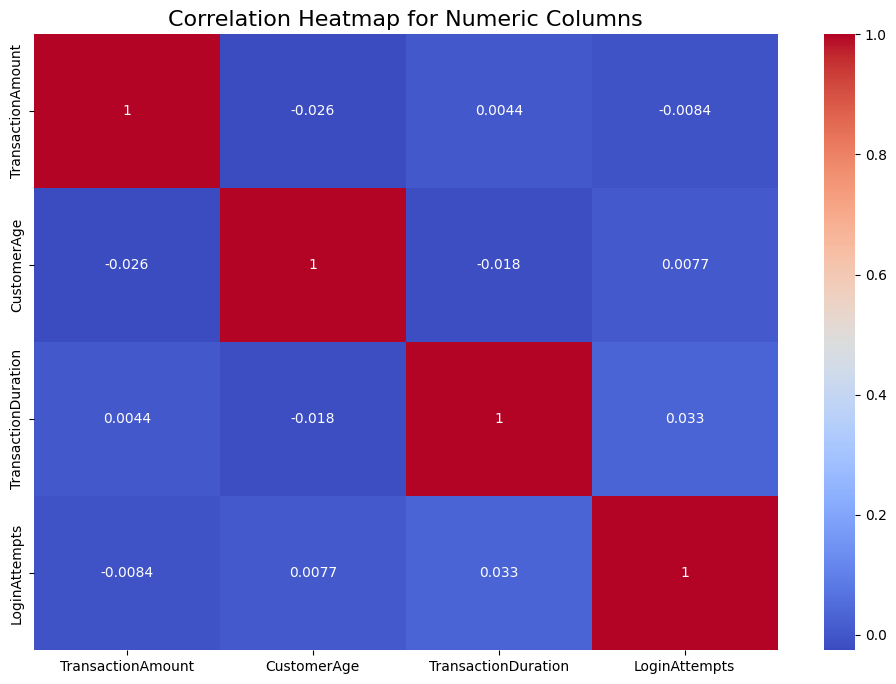

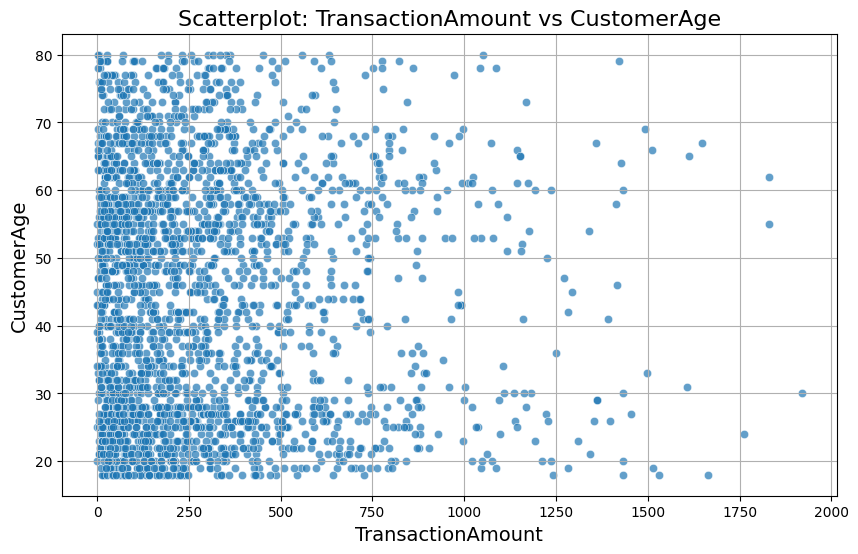

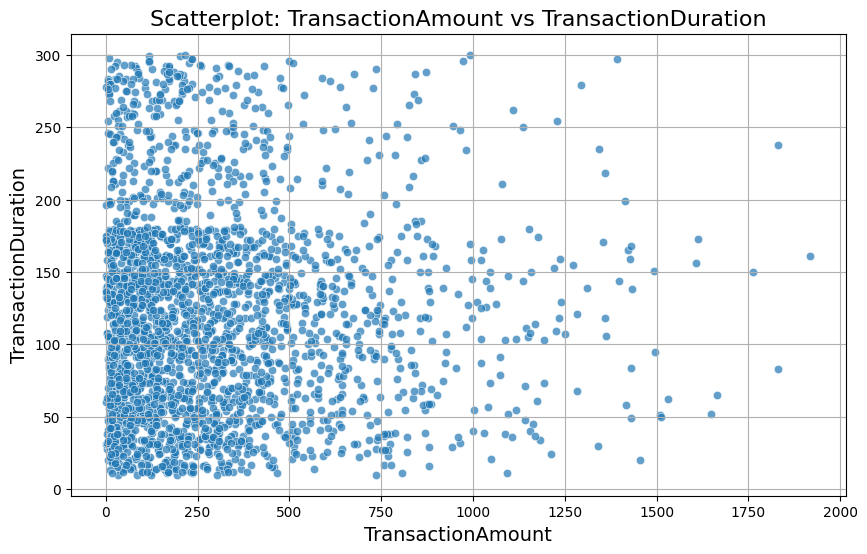

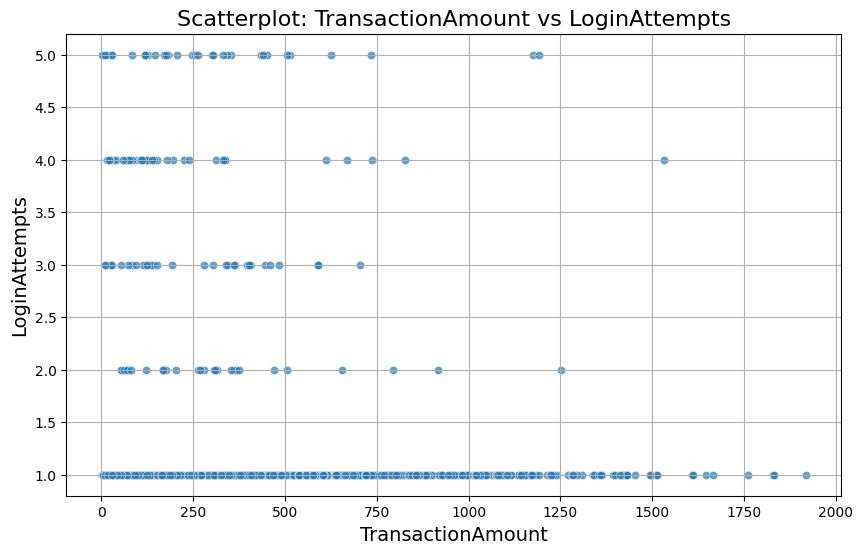

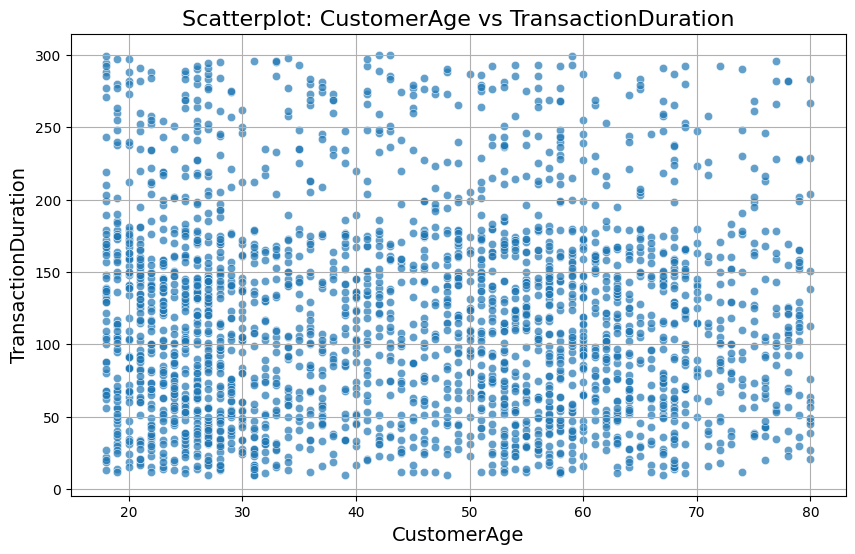

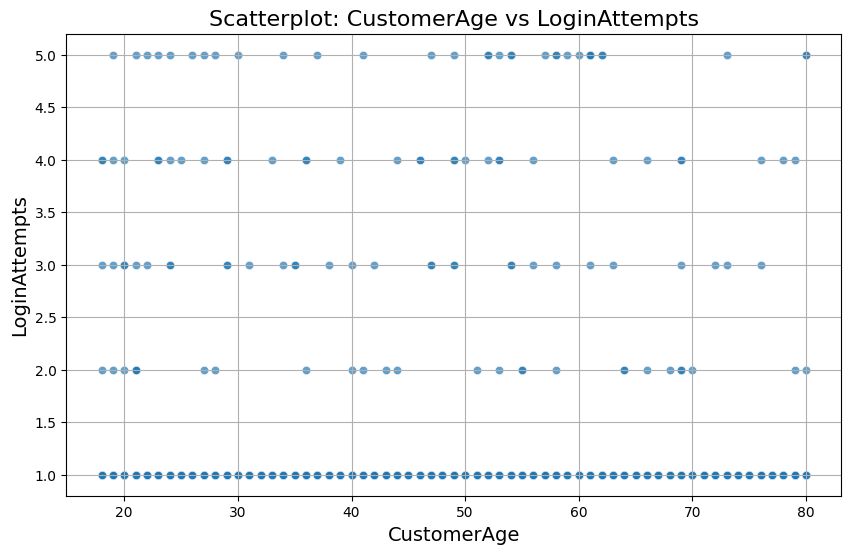

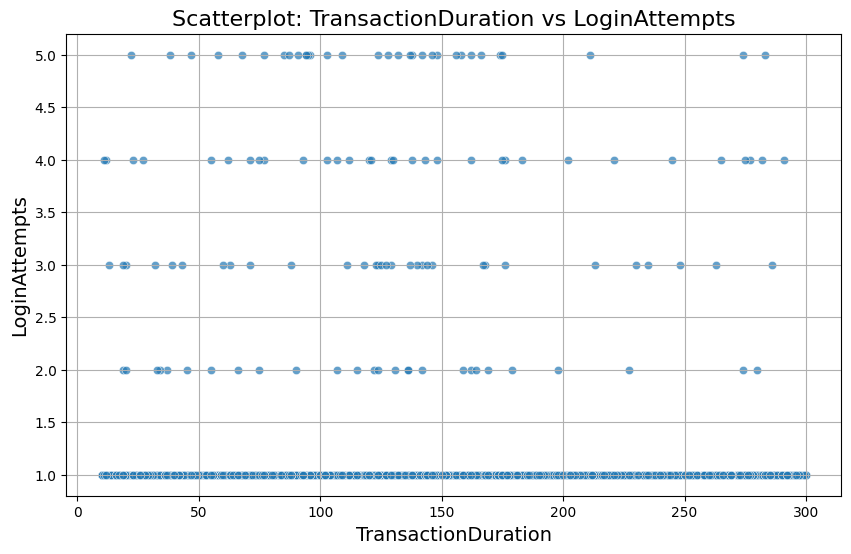

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


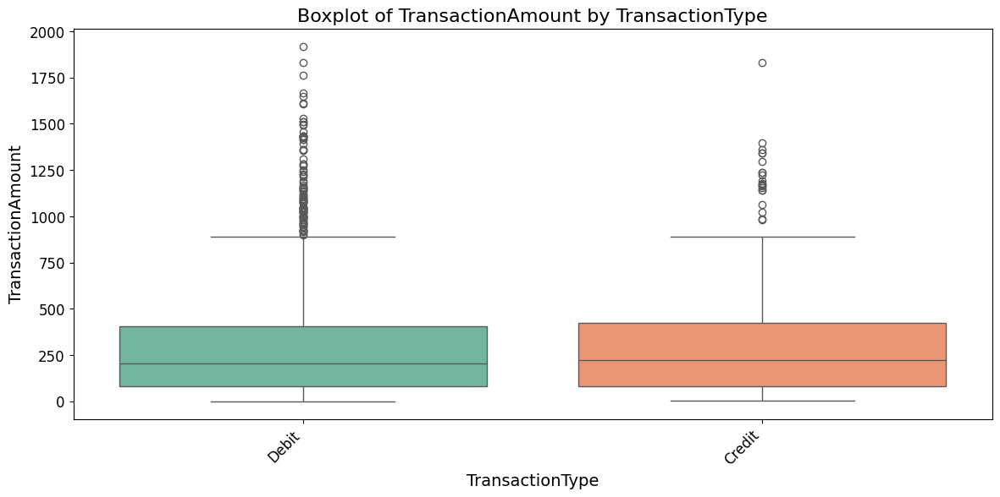

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


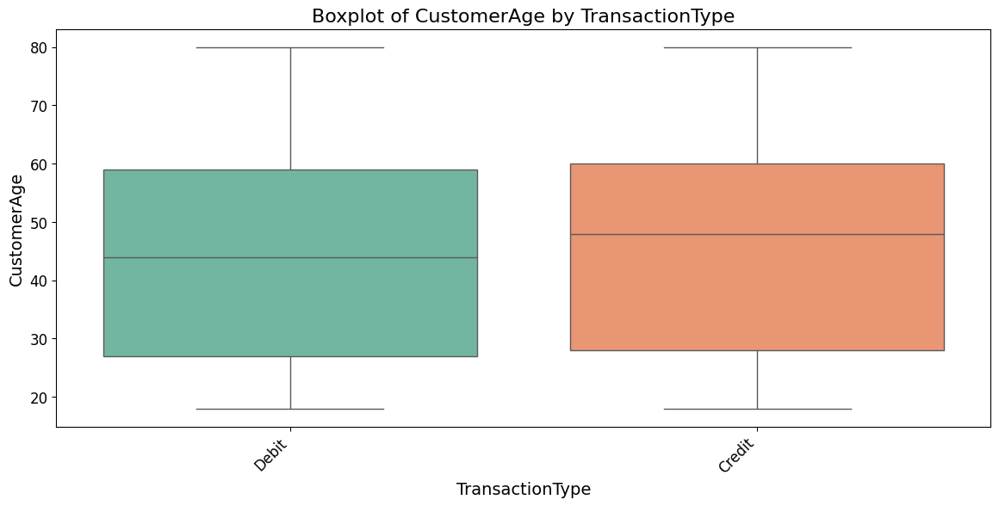

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


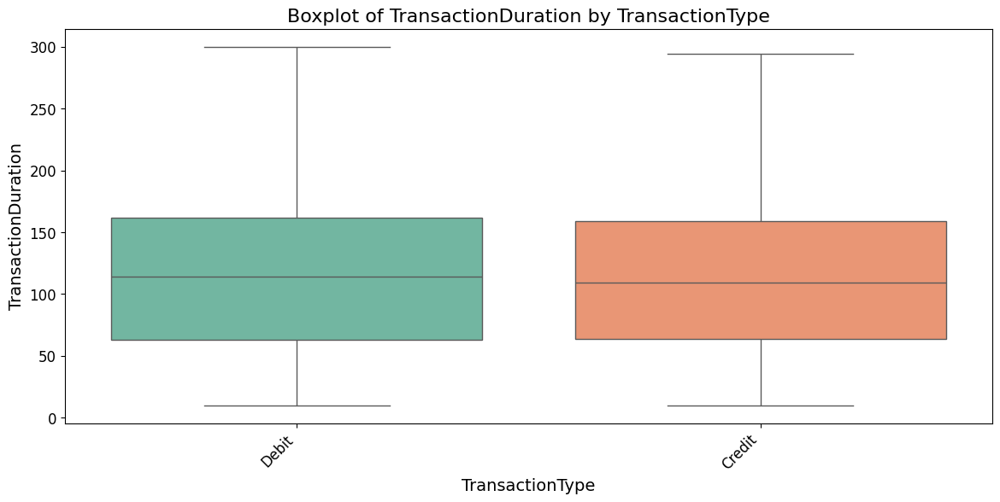

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


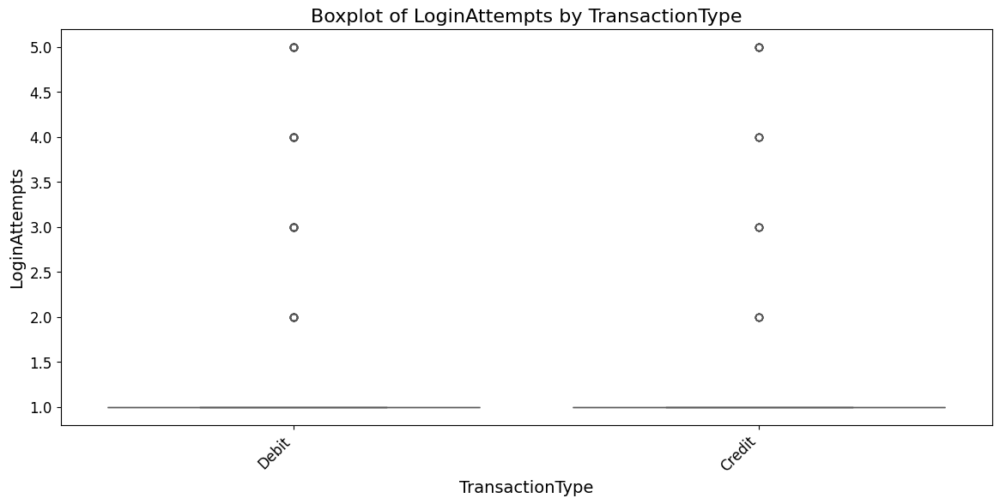

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


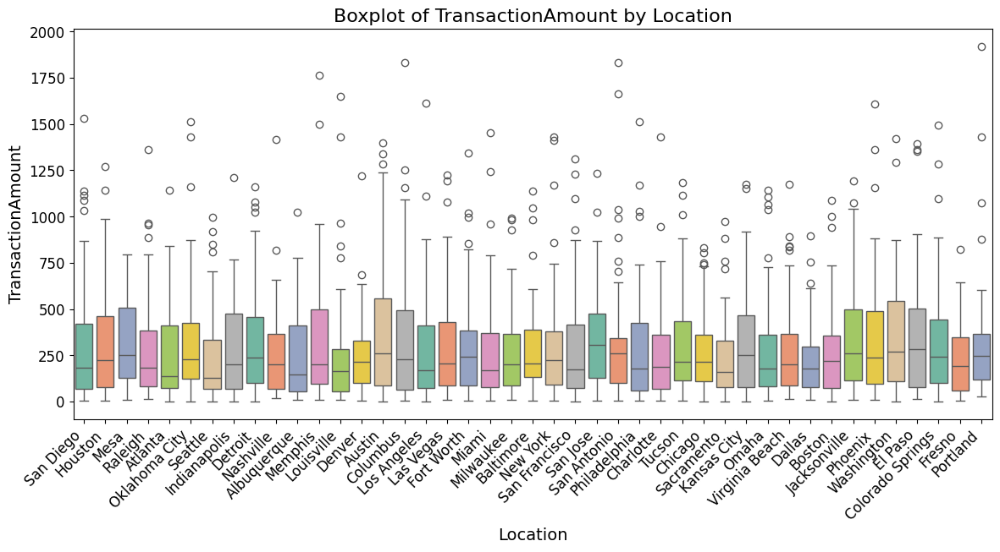

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


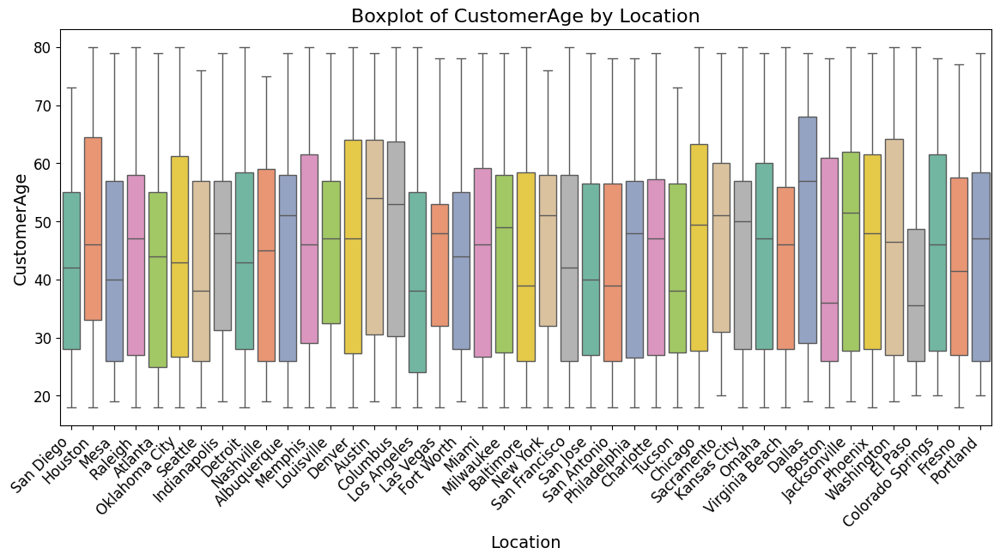

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


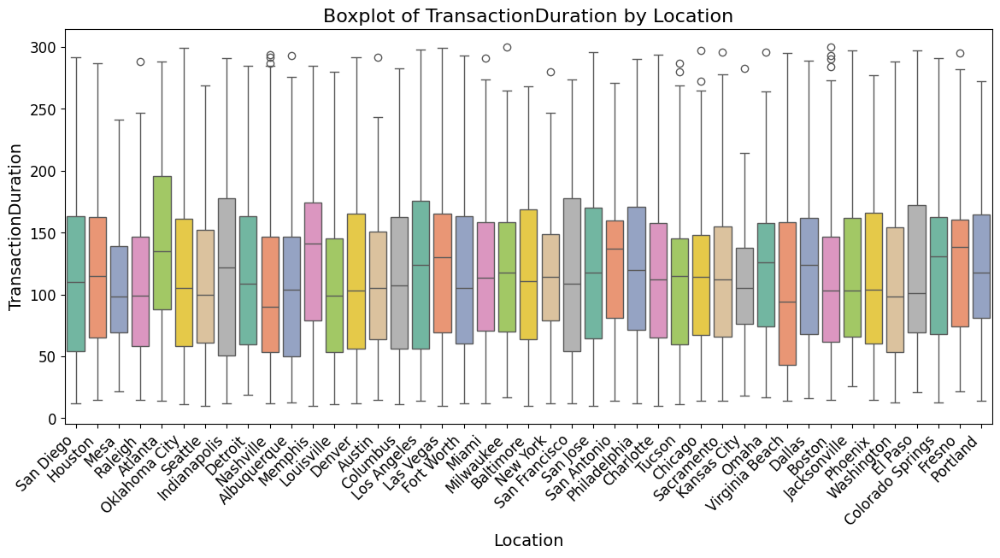

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


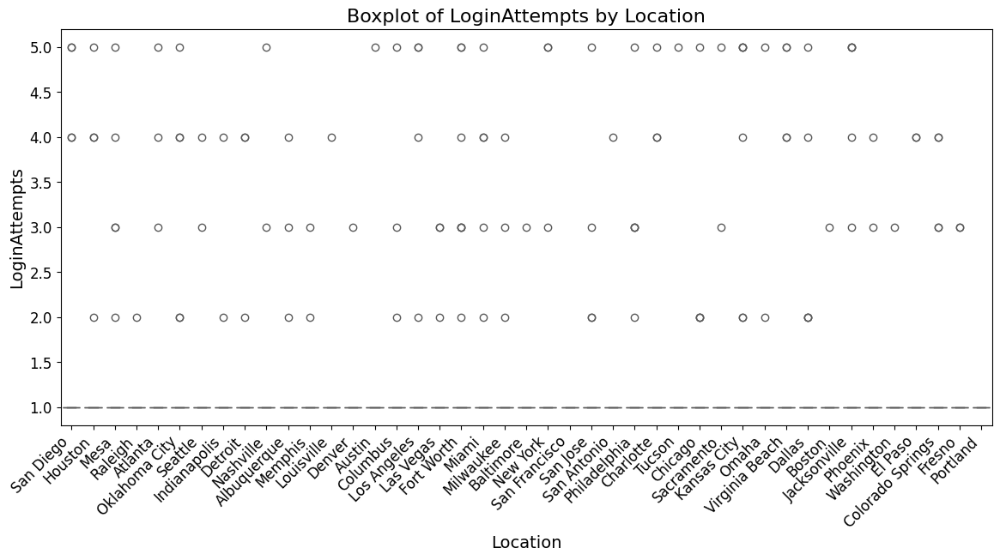

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


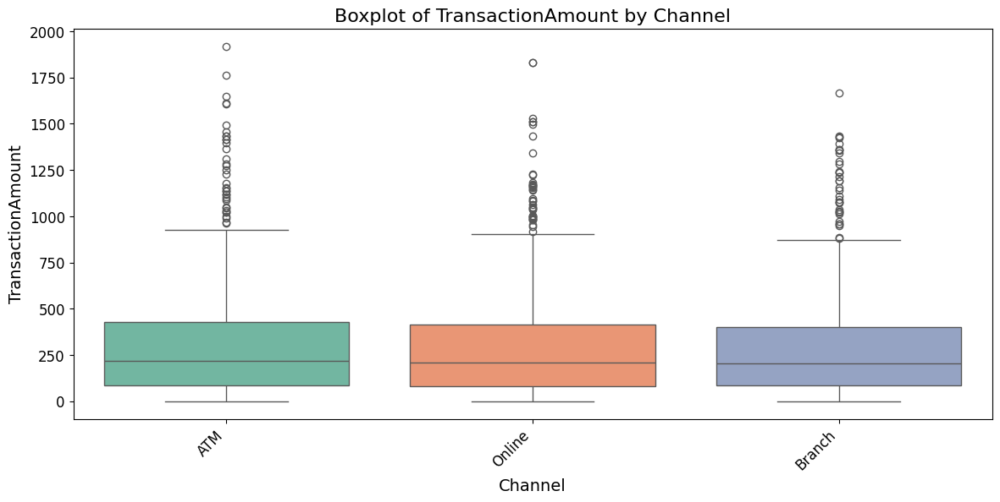

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


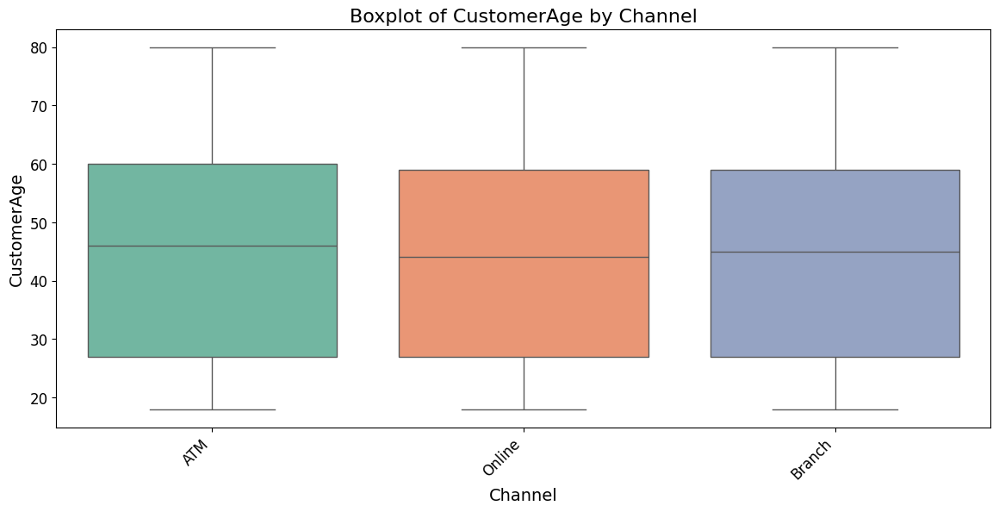

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


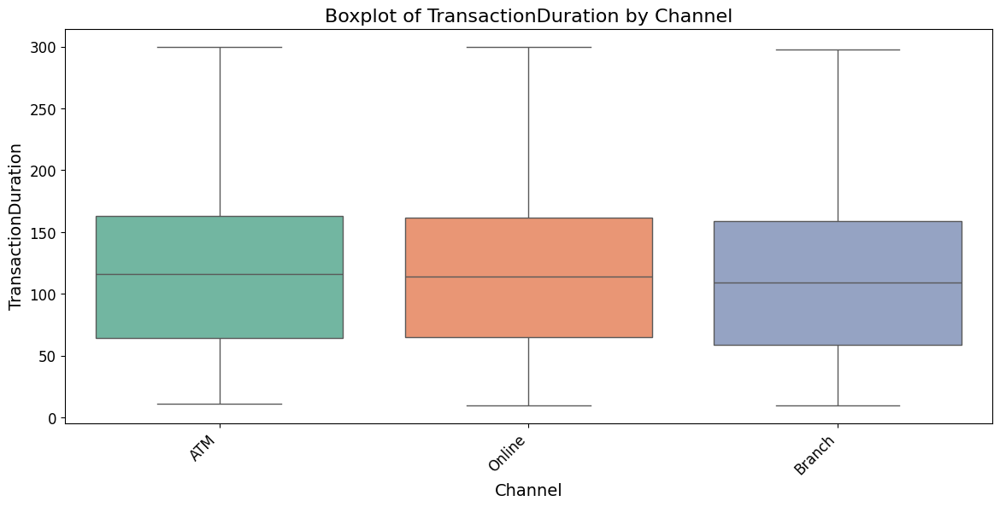

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


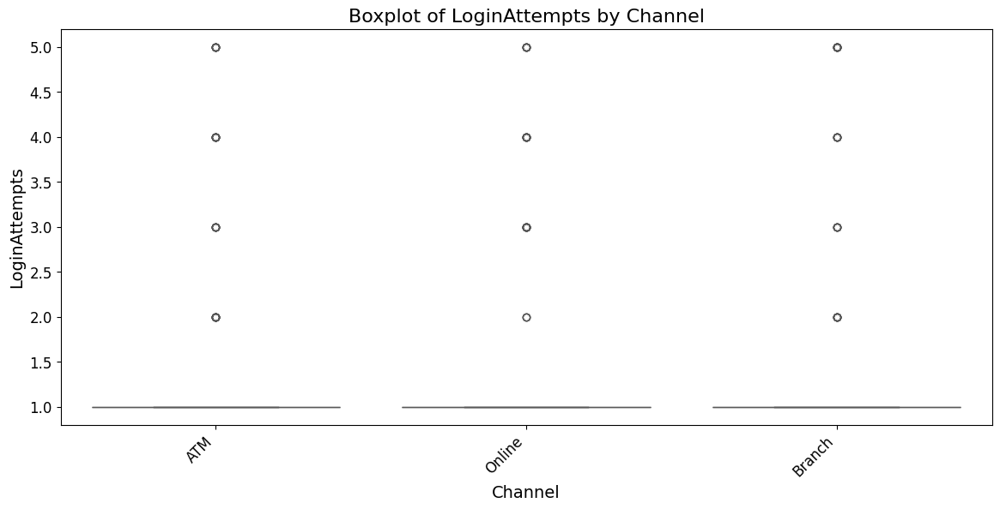

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


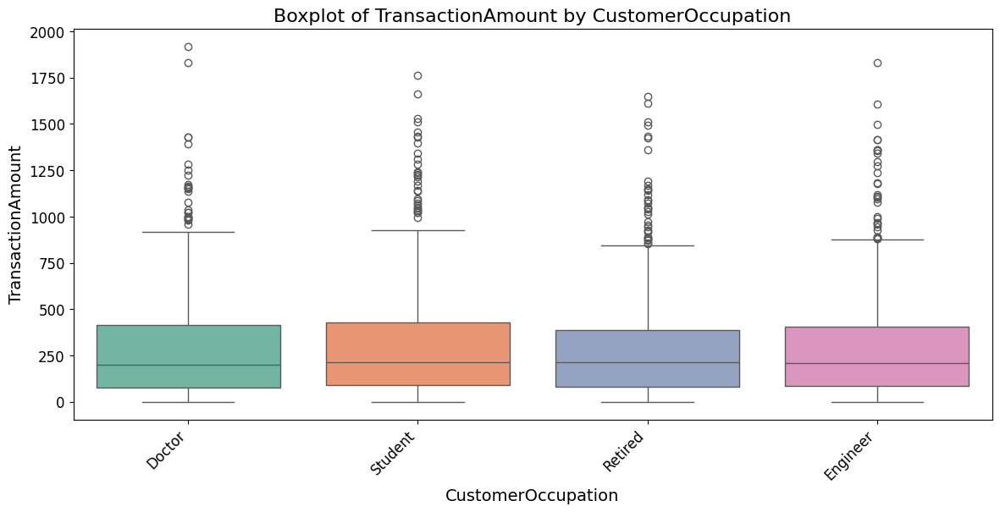

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


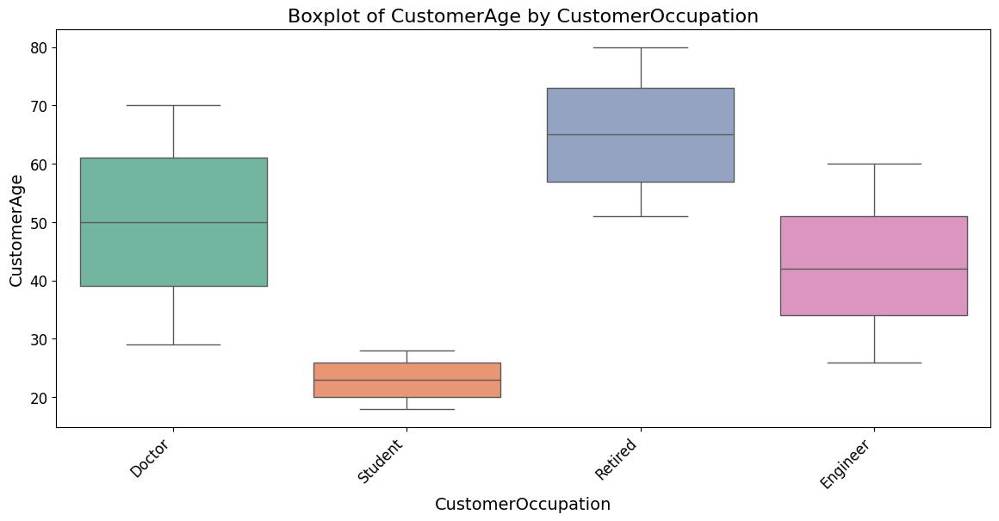

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


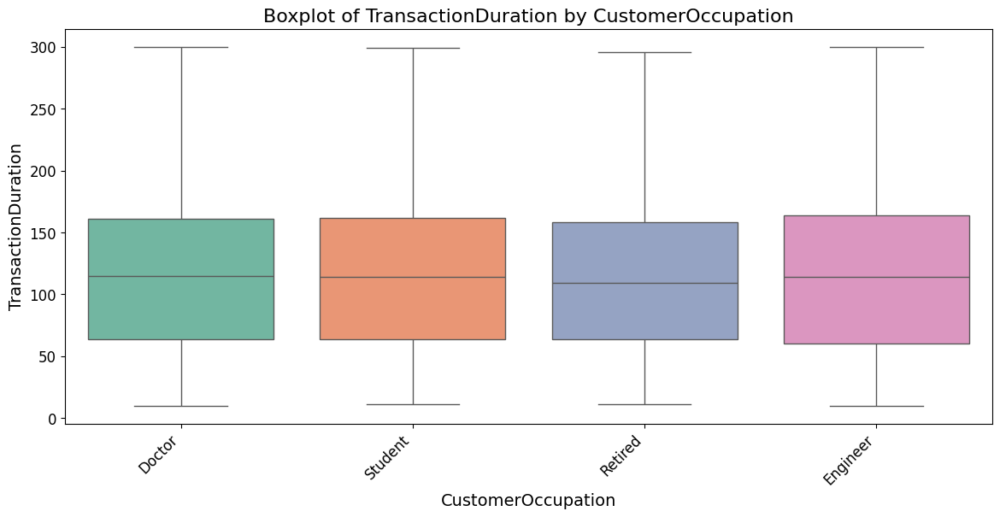

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3349659753.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')


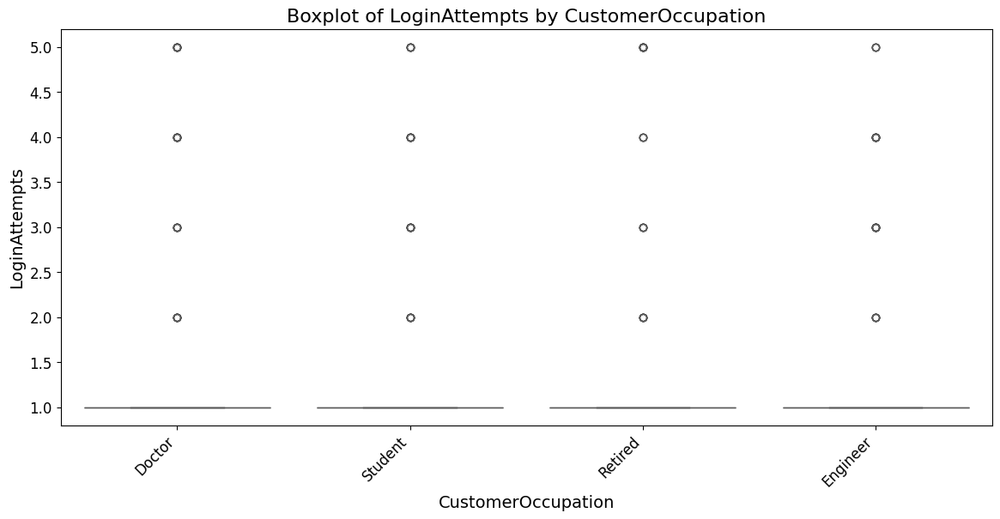

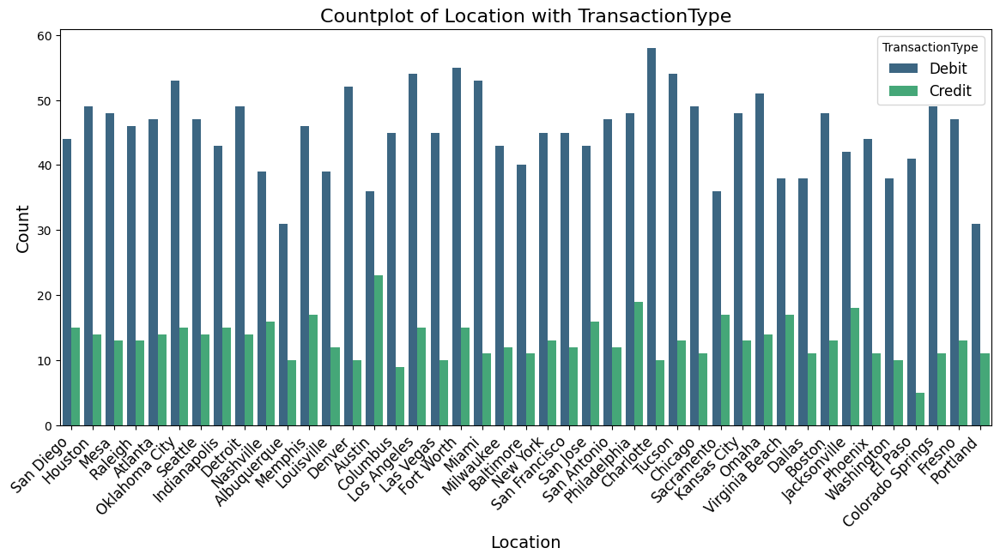

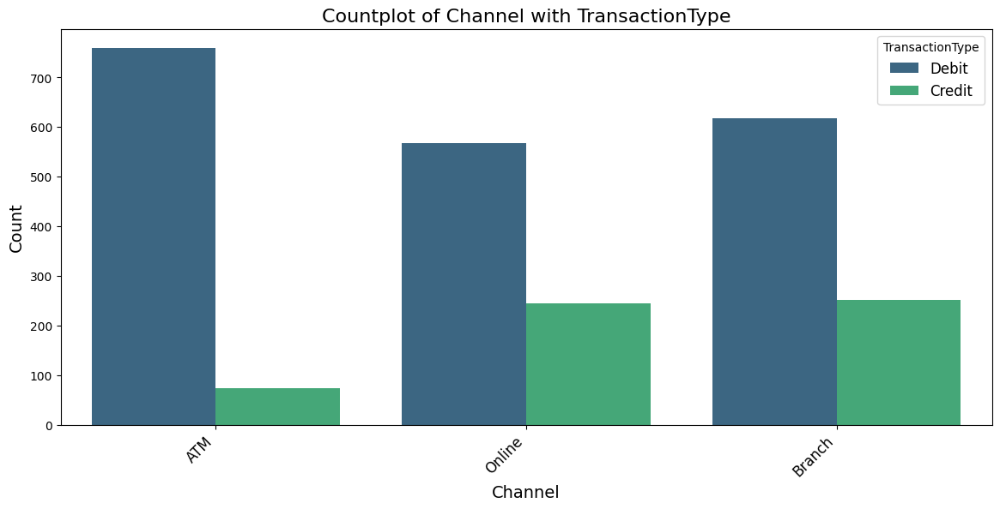

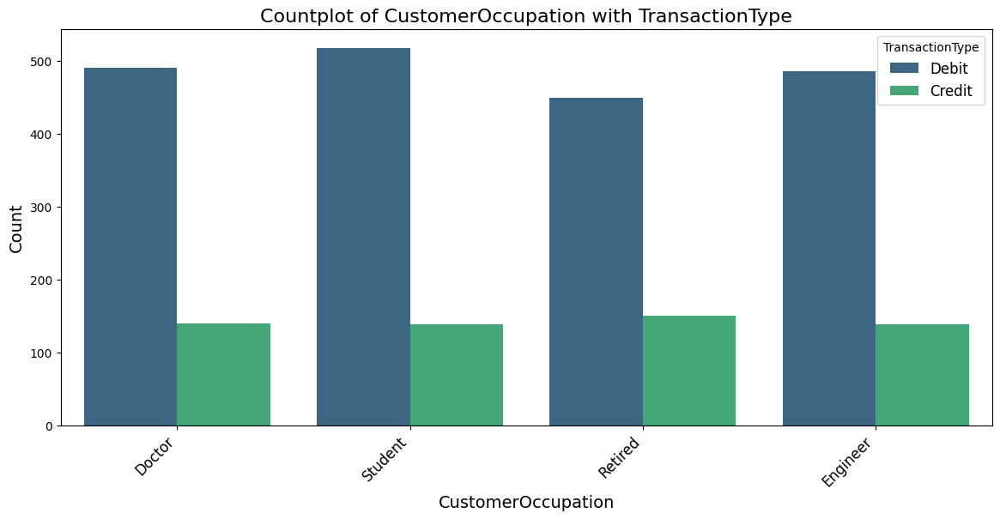

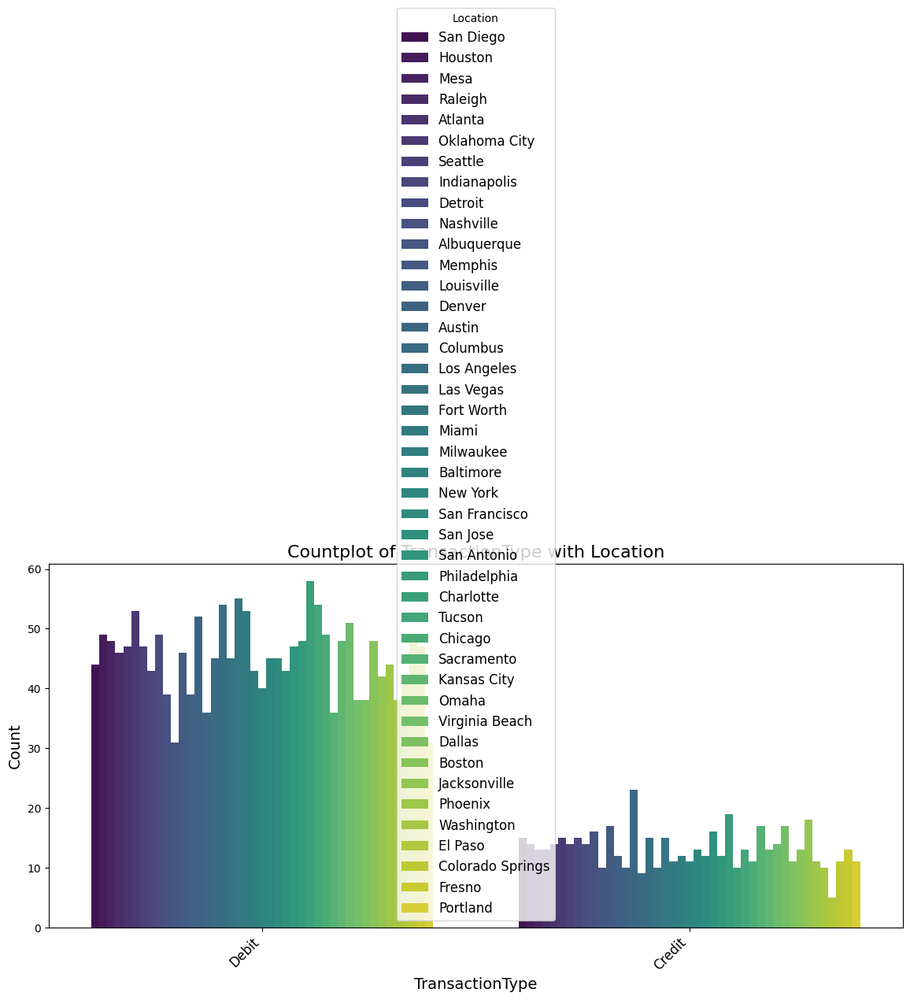

...

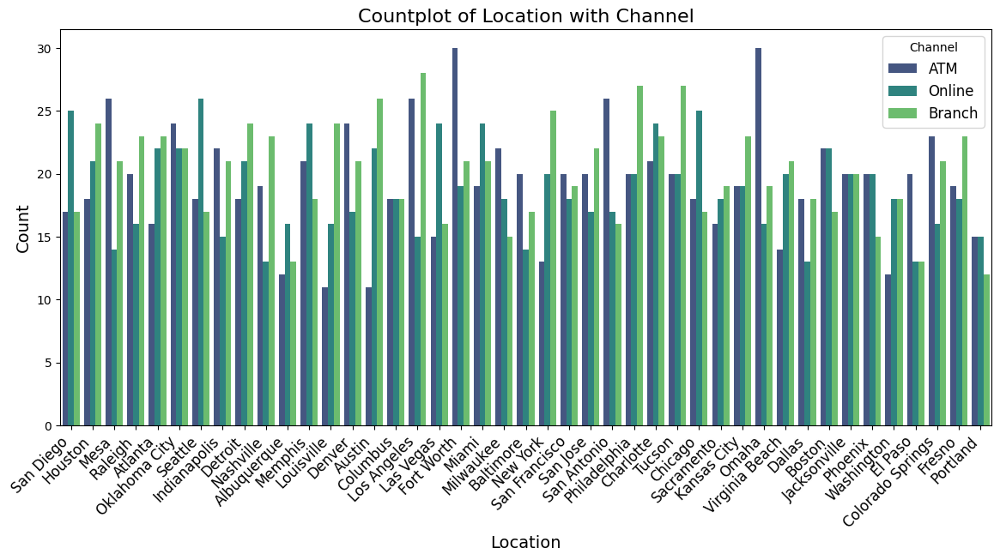

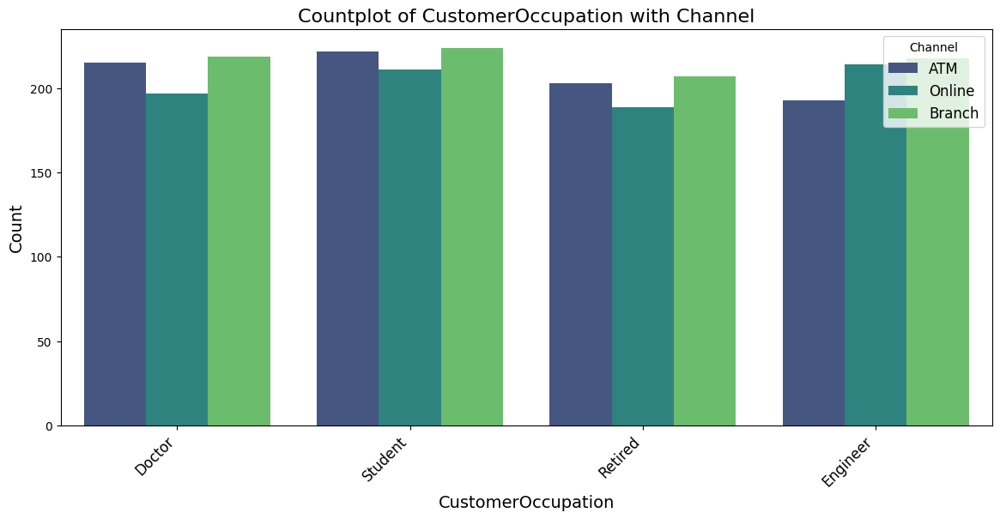

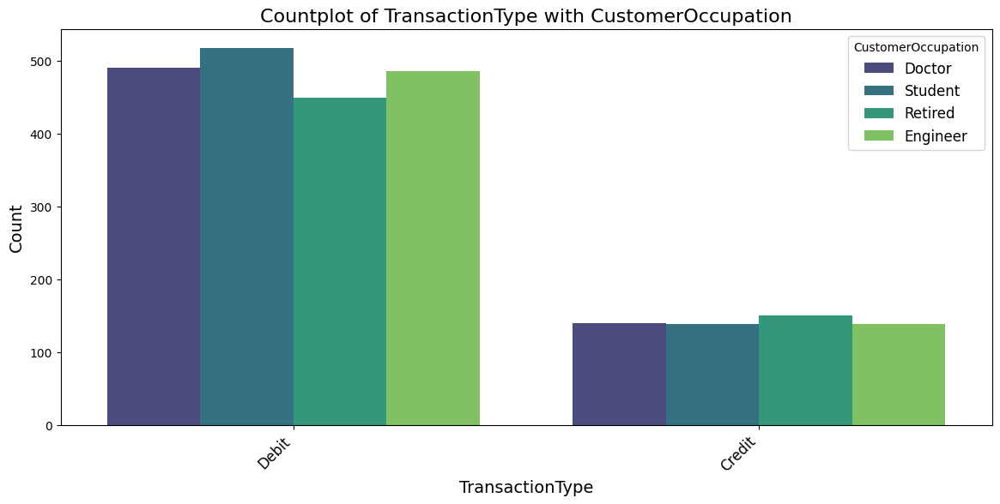

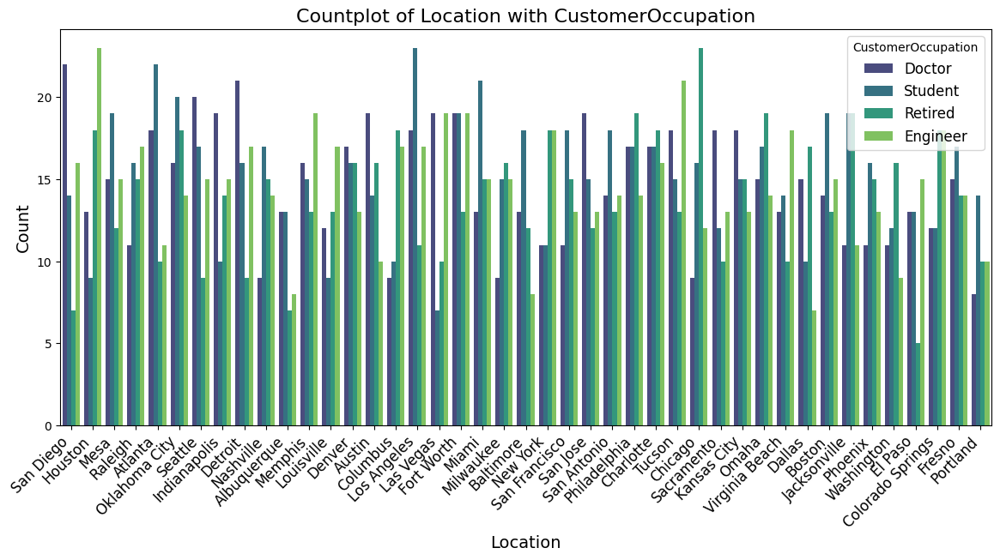

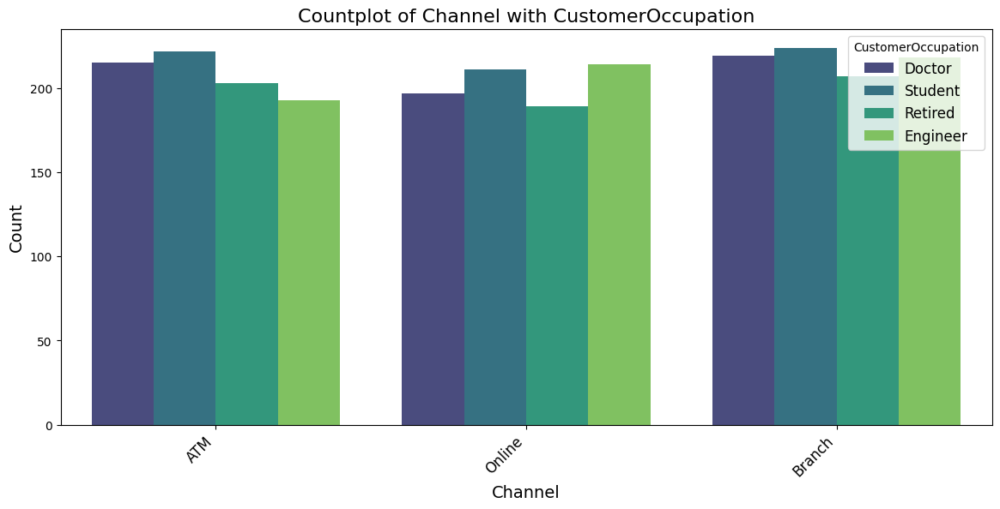

In [5]:
# Define numeric and categorical columns
numeric_cols = ['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts']
categorical_cols = ['TransactionType', 'Location', 'Channel', 'CustomerOccupation']

# 1. Correlation Heatmap for Numeric Columns
plt.figure(figsize=(12, 8))
sns.heatmap(data[numeric_cols].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap for Numeric Columns', fontsize=16)
plt.show()

# 2. Scatterplots for Numeric vs Numeric
for i, col1 in enumerate(numeric_cols):
    for col2 in numeric_cols[i+1:]:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=data[col1], y=data[col2], alpha=0.7)
        plt.title(f'Scatterplot: {col1} vs {col2}', fontsize=16)
        plt.xlabel(col1, fontsize=14)
        plt.ylabel(col2, fontsize=14)
        plt.grid(True)
        plt.show()

# 3. Boxplot for Numeric vs Categorical
for cat_col in categorical_cols:
    for num_col in numeric_cols:
        plt.figure(figsize=(14, 6))
        sns.boxplot(x=cat_col, y=num_col, data=data, palette='Set2')
        plt.title(f'Boxplot of {num_col} by {cat_col}', fontsize=16)
        plt.xlabel(cat_col, fontsize=14)
        plt.ylabel(num_col, fontsize=14)
        plt.xticks(rotation=45, fontsize=12, ha='right')
        plt.yticks(fontsize=12)
        plt.show()

# 4. Countplot with Hue for Categorical vs Categorical
for cat1 in categorical_cols:
    for cat2 in categorical_cols:
        if cat1 != cat2:  # Avoid self-comparison
            plt.figure(figsize=(14, 6))
            sns.countplot(x=cat2, hue=cat1, data=data, palette='viridis')
            plt.title(f'Countplot of {cat2} with {cat1}', fontsize=16)
            plt.xlabel(cat2, fontsize=14)
            plt.ylabel('Count', fontsize=14)
            plt.xticks(rotation=45, fontsize=12, ha='right')
            plt.legend(title=cat1, fontsize=12)
            plt.show()


## **3. Multivariate Analysis**
### Explores interactions among three or more variables to uncover complex relationships, often visualized with pairplots or multidimensional clustering methods.

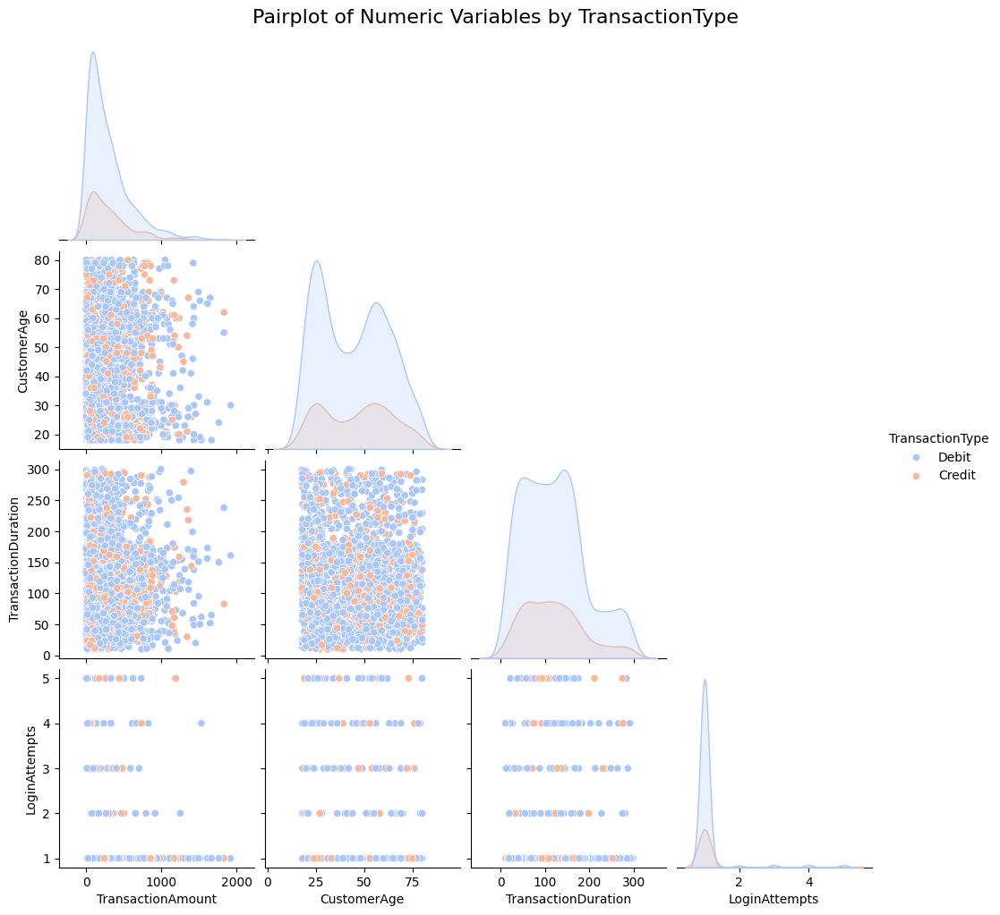

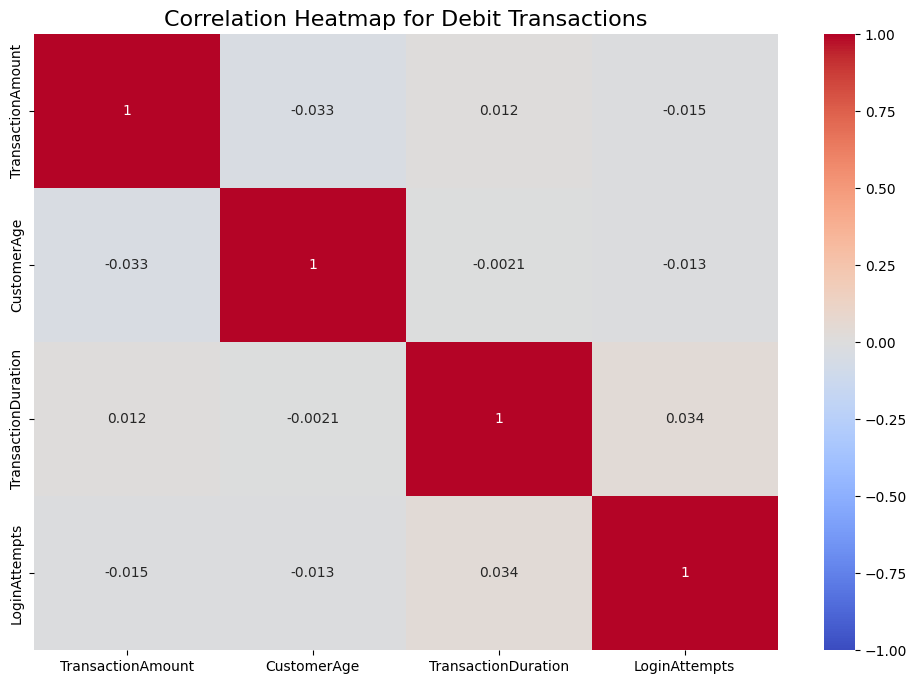

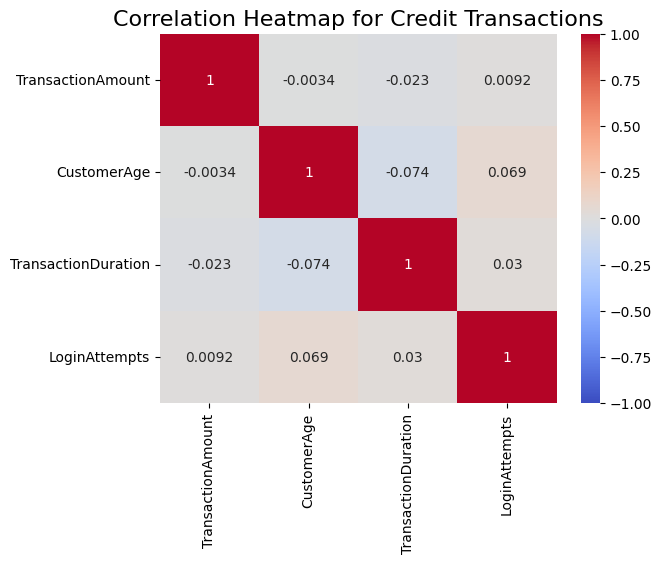

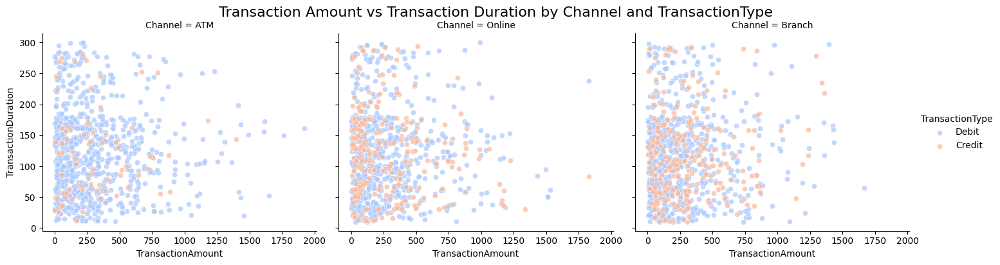

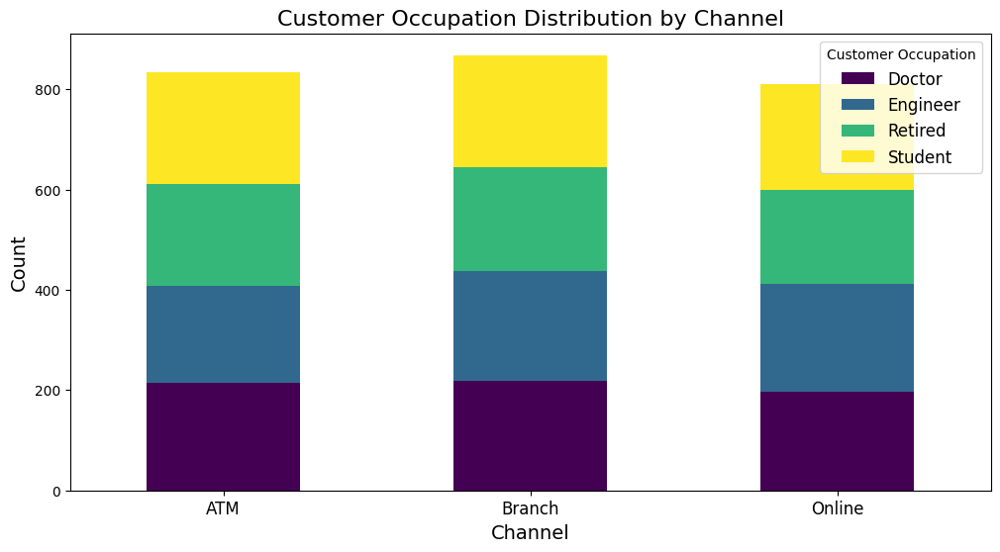

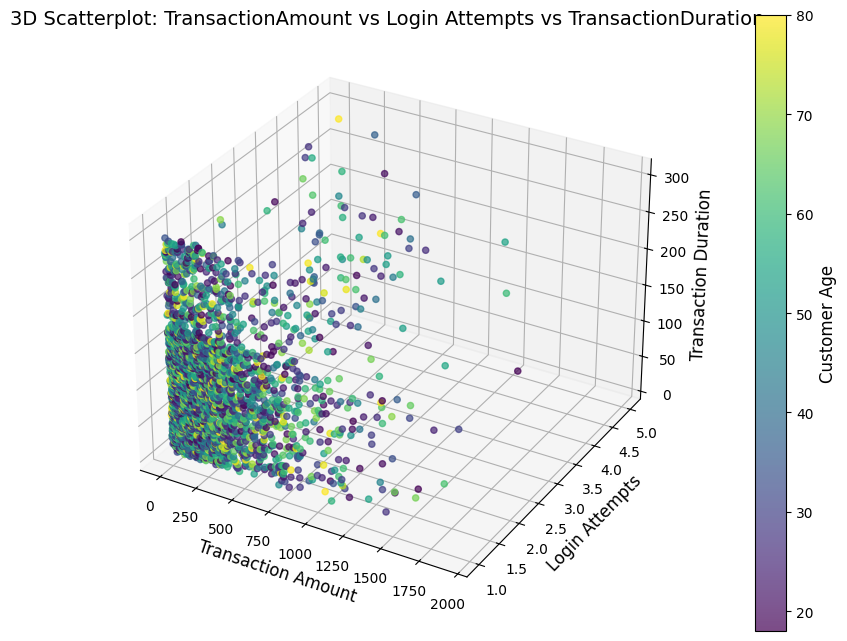

In [6]:


# 1. Multivariate Pairplot (Numeric variables colored by a categorical variable)
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
sns.pairplot(data, vars=numeric_cols, hue='TransactionType', palette='coolwarm', corner=True, diag_kind='kde')
plt.suptitle('Pairplot of Numeric Variables by TransactionType', fontsize=16, y=1.02)
plt.show()


# 2. Heatmap of Numeric Correlations grouped by a Categorical Variable
plt.figure(figsize=(12, 8))
for trans_type in data['TransactionType'].unique():
    subset = data[data['TransactionType'] == trans_type]
    plt.title(f'Correlation Heatmap for {trans_type} Transactions', fontsize=16)
    sns.heatmap(subset[numeric_cols].corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.show()

# 3. FacetGrid: Scatterplot of Transaction Amount vs Account Balance by Channel
g = sns.FacetGrid(data, col="Channel", hue="TransactionType", palette="coolwarm", height=4, aspect=1.2)
g.map(sns.scatterplot, "TransactionAmount", "TransactionDuration", alpha=0.7)
g.add_legend()
g.fig.suptitle('Transaction Amount vs Transaction Duration by Channel and TransactionType', fontsize=16, y=1.02)
plt.show()

# 4. Stacked Bar Chart: Customer Occupation Distribution by Channel
occupation_channel = data.groupby(['Channel', 'CustomerOccupation']).size().unstack()
occupation_channel.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
plt.title('Customer Occupation Distribution by Channel', fontsize=16)
plt.xlabel('Channel', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=0, fontsize=12)
plt.legend(title='Customer Occupation', fontsize=12)
plt.show()

# 5. 3D Scatterplot: Visualize three numeric variables

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    data['TransactionAmount'], 
    data['LoginAttempts'], 
    data['TransactionDuration'], 
    c=data['CustomerAge'], 
    cmap='viridis', 
    alpha=0.7
)
ax.set_xlabel('Transaction Amount', fontsize=12)
ax.set_ylabel('Login Attempts', fontsize=12)
ax.set_zlabel('Transaction Duration', fontsize=12)
plt.title('3D Scatterplot: TransactionAmount vs Login Attempts vs TransactionDuration', fontsize=14)
cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Customer Age', fontsize=12)
plt.show()

---
# **Anomaly Detection Methods**
----

### **SETUP**
Importing necessary libraries, preprocessing columns for uniform formatting, defining columns based on datatype, encoding data to avoid dummy variable trap and producing descriptive statistics of given dataset.

Geolocation analysis is included in the setup through a bulk processing of the unique IP Addresses and Locations by IPinfo (https://ipinfo.io/).

Geospatial information are included as features of the dataset, and a brief EDA is conducted on them through visualizations for distributions.

In [7]:

import pandas as pd

# Drop any existing 'ip_loc' and 'location_loc' columns to avoid duplicates when repeating this module
data = data.drop(columns=['ip_loc', 'location_loc'], errors='ignore')

# Load the IP geolocation CSV (which contains the "IP" and "loc" fields)
ip_loc_data = pd.read_csv('../data/ip_geolocation.csv')

# Preview the IP location data
print(ip_loc_data.head())

# Merge the original data with the IP geolocation data on the 'IP Address' field
data = pd.merge(data, ip_loc_data[['ip', 'loc']], left_on='IP Address', right_on='ip', how='left')

# Drop the temporary 'IP' column after merge
data = data.drop(columns=['ip'])

# Rename the 'loc' column to 'ip_loc'
data.rename(columns={'loc': 'ip_loc'}, inplace=True)

# Load the localization data with lat/lon
localization_data = pd.read_csv('../data/location_geolocation.csv', delimiter=';')

# Preview the localization data to check the columns
print(localization_data.head())

# Merge the main dataset with the localization data on the 'Location' field
data = pd.merge(data, localization_data[['localization', 'loc']], left_on='Location', right_on='localization', how='left')

# Drop the temporary 'localization' column after merge
data = data.drop(columns=['localization'])

# Rename the 'loc' column to 'location_loc' for consistency
data.rename(columns={'loc': 'location_loc'}, inplace=True)

# Show the updated data with the new 'location_loc' column
print(data.head())

               ip  fetch_error bogon  \
0  162.198.218.92          NaN   NaN   
1     13.149.61.4          NaN   NaN   
2  215.97.143.157          NaN   NaN   
3  200.13.225.150          NaN   NaN   
4    65.164.3.100          NaN   NaN   

                                         hostname  anycast      city  \
0  162-198-218-92.lightspeed.gnvlsc.sbcglobal.net      NaN   Taylors   
1                                             NaN      NaN   Norwalk   
2                                             NaN      NaN  Columbus   
3             static-epm200-13-225-150.epm.net.co      NaN    Itagüí   
4                                             NaN      NaN     Bryan   

           region country  postal               loc          timezone  \
0  South Carolina      US   29687  34.9204,-82.2962  America/New_York   
1     Connecticut      US   06851  41.1176,-73.4079  America/New_York   
2            Ohio      US   43218  39.9690,-83.0114  America/New_York   
3       Antioquia      CO  055410 

Number of NaNs in ip_loc: 13


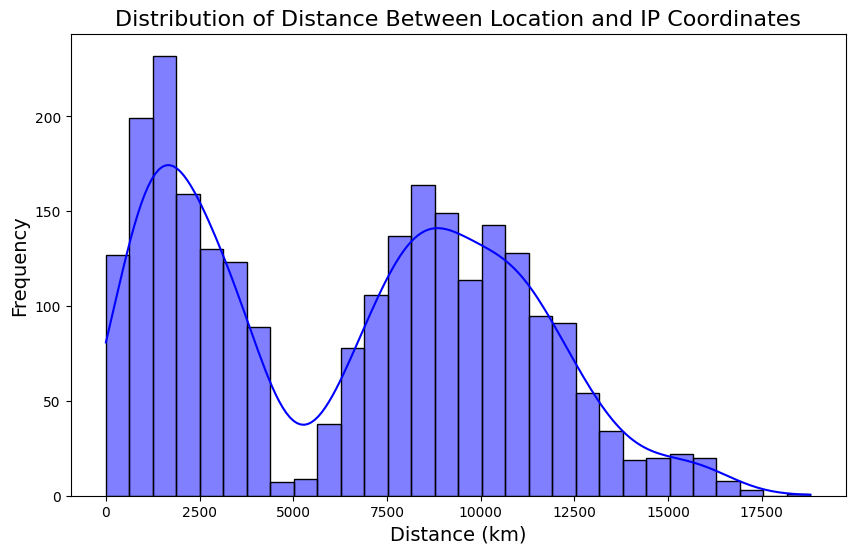

Total number of rows with large divergence (> 7280.0669089689 km): 1249
         Location      IP Address  distance_loc_ip
5   Oklahoma City  117.67.192.211     11577.450401
10    Albuquerque    213.15.9.253     14636.635454
11        Memphis  116.175.11.222     12085.041856
12           Mesa  210.98.198.143     10072.078346
13        Memphis    193.83.0.183      8072.063856


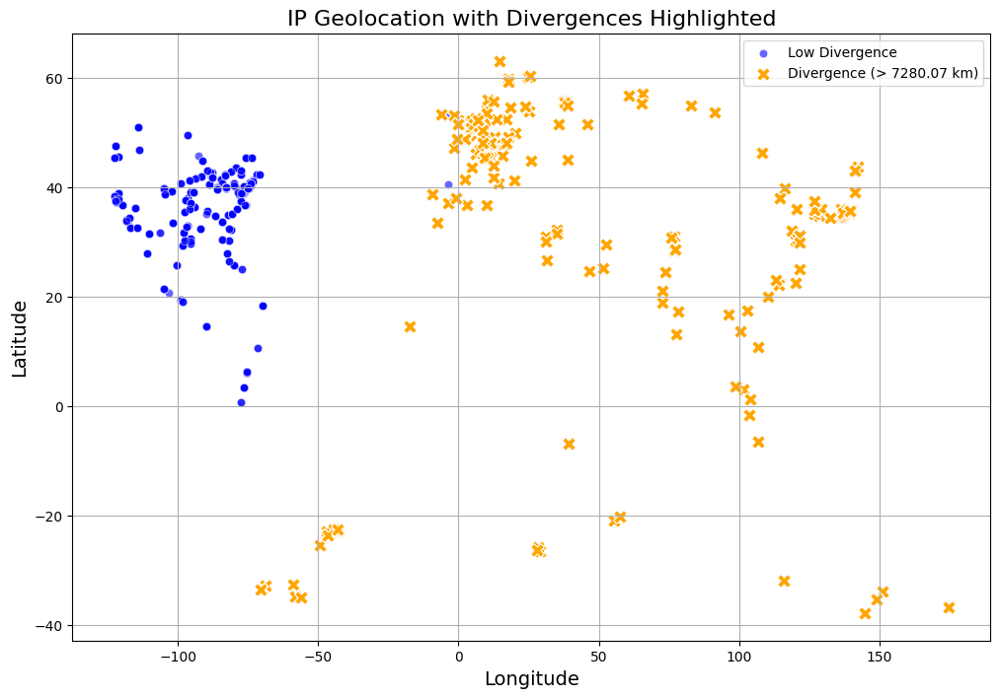

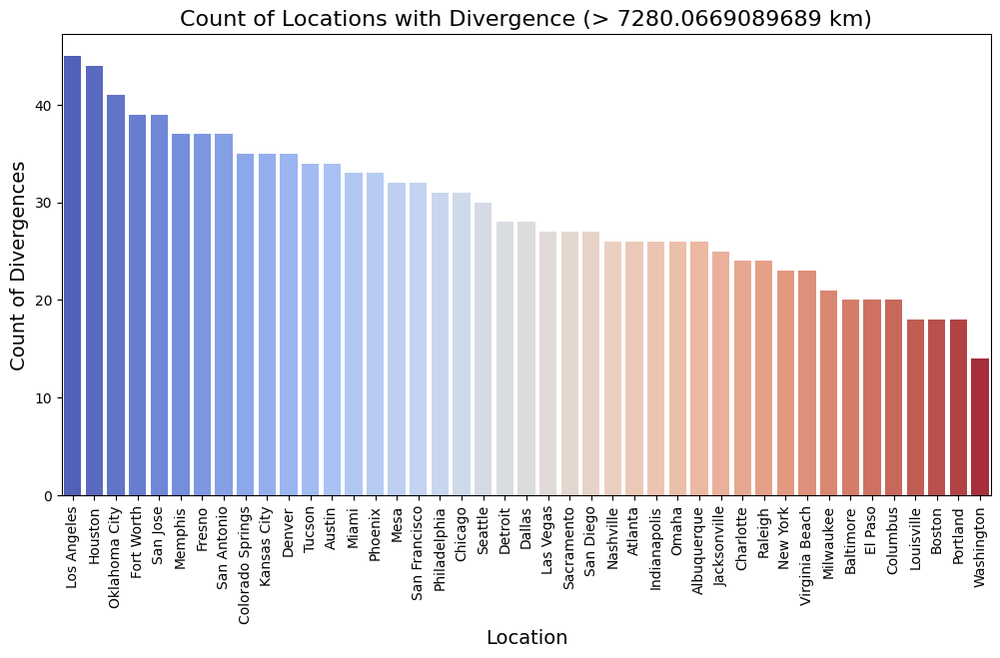

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from geopy.distance import geodesic

# Function to split and handle invalid coordinates
def split_coordinates(loc_str):
    try:
        lat, lon = map(float, loc_str.split(','))
        return lat, lon
    except:
        return np.nan, np.nan  # Return NaN if split fails

# Apply the function to the location and IP coordinates
data[['location_lat', 'location_lon']] = data['location_loc'].apply(lambda x: pd.Series(split_coordinates(x)))
data[['ip_lat', 'ip_lon']] = data['ip_loc'].apply(lambda x: pd.Series(split_coordinates(x)))

# Check for NaN values in ip_loc (print the number of NaNs)
ip_loc_nans = data['ip_loc'].isna().sum()
print(f"Number of NaNs in ip_loc: {ip_loc_nans}")

# Drop rows where we have NaN for either location or IP coordinates
data = data.dropna(subset=['location_lat', 'location_lon', 'ip_lat', 'ip_lon'])

# Calculate the Euclidean distance or Haversine distance between location and IP coordinates
def calculate_distance(row):
    loc_coords = (row['location_lat'], row['location_lon'])
    ip_coords = (row['ip_lat'], row['ip_lon'])
    distance = geodesic(loc_coords, ip_coords).km  # distance in kilometers
    return distance

# Apply the distance function to calculate the differences for each row
data['distance_loc_ip'] = data.apply(calculate_distance, axis=1)

# Visualize the distribution of the distance between the location and IP coordinates
plt.figure(figsize=(10, 6))
sns.histplot(data['distance_loc_ip'], kde=True, color='blue', bins=30)
plt.title('Distribution of Distance Between Location and IP Coordinates', fontsize=16)
plt.xlabel('Distance (km)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

# Find the median of the distances
median_distance = data['distance_loc_ip'].median()

# Flag significant divergences (those exceeding the median distance)
data['large_divergence'] = data['distance_loc_ip'] > median_distance

# Show examples of significant divergences
large_divergence_examples = data[data['large_divergence']]

# Print the number of rows with significant divergence and preview
print(f"Total number of rows with large divergence (> {median_distance} km): {large_divergence_examples.shape[0]}")
print(large_divergence_examples[['Location', 'IP Address', 'distance_loc_ip']].head())

# 1. Scatterplot of latitude vs longitude for IPs, highlighting those with large divergence
plt.figure(figsize=(12, 8))

# Plot all IP locations in one color (blue)
sns.scatterplot(x=data['ip_lon'], y=data['ip_lat'], label='Low Divergence', alpha=0.6, color='blue')

# Highlight the points with significant divergences (orange)
sns.scatterplot(x=large_divergence_examples['ip_lon'], y=large_divergence_examples['ip_lat'], 
                label=f'Divergence (> {round(median_distance, 2)} km)', color='orange', marker='X', s=100)

# Customize and show the plot
plt.title('IP Geolocation with Divergences Highlighted', fontsize=16)
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Latitude', fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

# 2. Histogram: Count the locations with significant divergences
plt.figure(figsize=(12, 6))
large_divergence_counts = large_divergence_examples['Location'].value_counts()
sns.barplot(x=large_divergence_counts.index, y=large_divergence_counts.values, palette='coolwarm')
plt.title(f'Count of Locations with Divergence (> {median_distance} km)', fontsize=16)
plt.xlabel('Location', fontsize=14)
plt.ylabel('Count of Divergences', fontsize=14)
plt.xticks(rotation=90)
plt.show()


In [9]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import KMeans, DBSCAN
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import LinearRegression
from scipy.stats import zscore
from scipy.cluster.hierarchy import linkage, fcluster
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from geopy.distance import geodesic

# Preprocessing: Handle datetime columns
data['TransactionDate'] = pd.to_datetime(data['TransactionDate'], format='%Y-%m-%d %H:%M:%S')
data['PreviousTransactionDate'] = pd.to_datetime(data['PreviousTransactionDate'], format='%Y-%m-%d %H:%M:%S')
data['TimeSinceLastTransaction'] = (data['TransactionDate'] - data['PreviousTransactionDate']).dt.total_seconds()

# Identify numeric and categorical columns
numeric_cols = ['TransactionAmount', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 'TimeSinceLastTransaction']
categorical_cols = ['TransactionType', 'Location', 'Channel', 'CustomerOccupation']

# Normalize numeric columns
scaler = StandardScaler()
numeric_scaled = pd.DataFrame(scaler.fit_transform(data[numeric_cols]), columns=numeric_cols)

# One-hot encode categorical columns
encoder = OneHotEncoder(sparse_output=False, drop='first')  # Avoid dummy variable trap
categorical_encoded = pd.DataFrame(encoder.fit_transform(data[categorical_cols]),
                                   columns=encoder.get_feature_names_out(categorical_cols))

# Combine preprocessed data
processed_data = pd.concat([numeric_scaled, categorical_encoded], axis=1)

# Descriptive Statistics
print("Descriptive Statistics:")
print(data[numeric_cols].describe())

# Initialize Fraud column
data['Fraud'] = False

# Handling location and IP coordinates
# Function to split and handle invalid coordinates
def split_coordinates(loc_str):
    try:
        lat, lon = map(float, loc_str.split(','))
        return lat, lon
    except:
        return np.nan, np.nan  # Return NaN if split fails

# Apply the function to the location and IP coordinates
data[['location_lat', 'location_lon']] = data['location_loc'].apply(lambda x: pd.Series(split_coordinates(x)))
data[['ip_lat', 'ip_lon']] = data['ip_loc'].apply(lambda x: pd.Series(split_coordinates(x)))

# Check for NaN values in ip_loc (print the number of NaNs)
ip_loc_nans = data['ip_loc'].isna().sum()
print(f"Number of NaNs in ip_loc: {ip_loc_nans}")

# Drop rows where we have NaN for either location or IP coordinates
data = data.dropna(subset=['location_lat', 'location_lon', 'ip_lat', 'ip_lon'])

# 1. Calculate the distance between location and IP (geospatial divergence)
def calculate_distance(row):
    loc_coords = (row['location_lat'], row['location_lon'])
    ip_coords = (row['ip_lat'], row['ip_lon'])
    distance = geodesic(loc_coords, ip_coords).km  # This should return the distance in kilometers
    return distance

# Apply the distance function to calculate the differences for each row
data['distance_loc_ip'] = data.apply(calculate_distance, axis=1)

# 2. Normalize the new features (geolocation features)
additional_cols = ['distance_loc_ip', 'location_lat', 'location_lon', 'ip_lat', 'ip_lon']
scaler = StandardScaler()
data_scaled = pd.DataFrame(scaler.fit_transform(data[additional_cols]), columns=additional_cols)

# 3. Combine the newly scaled features with the existing processed data
processed_data = pd.concat([processed_data, data_scaled], axis=1)

# 4. Updated Descriptive Statistics (including new geolocation features)
print("Updated Descriptive Statistics (including new geolocation features):")
print(data[additional_cols].describe())

# 5. Update `processed_data` to include the new geolocation features
processed_data.head(5)

Descriptive Statistics:
       TransactionAmount  TransactionDuration  LoginAttempts  CustomerAge  \
count        2499.000000          2499.000000    2499.000000  2499.000000   
mean          297.779536           119.766307       1.123649    44.634254   
std           292.279034            69.959778       0.599170    17.796147   
min             0.260000            10.000000       1.000000    18.000000   
25%            82.090000            63.000000       1.000000    27.000000   
50%           211.100000           113.000000       1.000000    45.000000   
75%           414.565000           161.000000       1.000000    59.000000   
max          1919.110000           300.000000       5.000000    80.000000   

       TimeSinceLastTransaction  
count              2.499000e+03  
mean              -4.214872e+07  
std                9.182251e+06  
min               -5.803267e+07  
25%               -5.016940e+07  
50%               -4.195712e+07  
75%               -3.409918e+07  
max       

,TransactionAmount,TransactionDuration,LoginAttempts,CustomerAge,TimeSinceLastTransaction,TransactionType_Debit,Location_Atlanta,Location_Austin,Location_Baltimore,Location_Boston,...,Channel_Branch,Channel_Online,CustomerOccupation_Engineer,CustomerOccupation_Retired,CustomerOccupation_Student,distance_loc_ip,location_lat,location_lon,ip_lat,ip_lon
0,-0.970806,-0.554234,-0.206409,1.425636,-0.798266,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.756489,-0.859329,-1.298956,0.036631,-0.844939
1,0.268497,0.303574,-0.206409,1.313229,-0.073504,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,-0.957186,-1.506673,0.075941,0.347741,-0.745561
2,-0.586850,-0.911653,-0.206409,-1.440727,0.049460,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,-0.884796,-0.704620,-0.962979,0.290080,-0.852935
3,-0.387651,-1.354854,-0.206409,-1.047304,-0.572381,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,-0.739925,-0.188805,1.129958,-1.405956,-0.770060
4,-0.972996,1.118491,-0.206409,-1.047304,0.971613,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,-1.300129,-0.632765,0.767854,0.365674,-0.870165


## **1. K-Means Clustering**
### Identifies anomalies based on distance from centroids.

Threshold: 4.347360956701892
Fraud summary: KMeans_Fraud
False    2481
True       18
Name: count, dtype: int64
First few rows of flagged transactions:
    TransactionAmount  KMeans_Distance  KMeans_Fraud
0              14.09         2.391067         False
1             376.24         2.223379         False
2             126.29         2.161440         False
3             184.50         2.494246         False
4              13.45         2.104547         False


/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/204502653.py:72: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  sns.scatterplot(


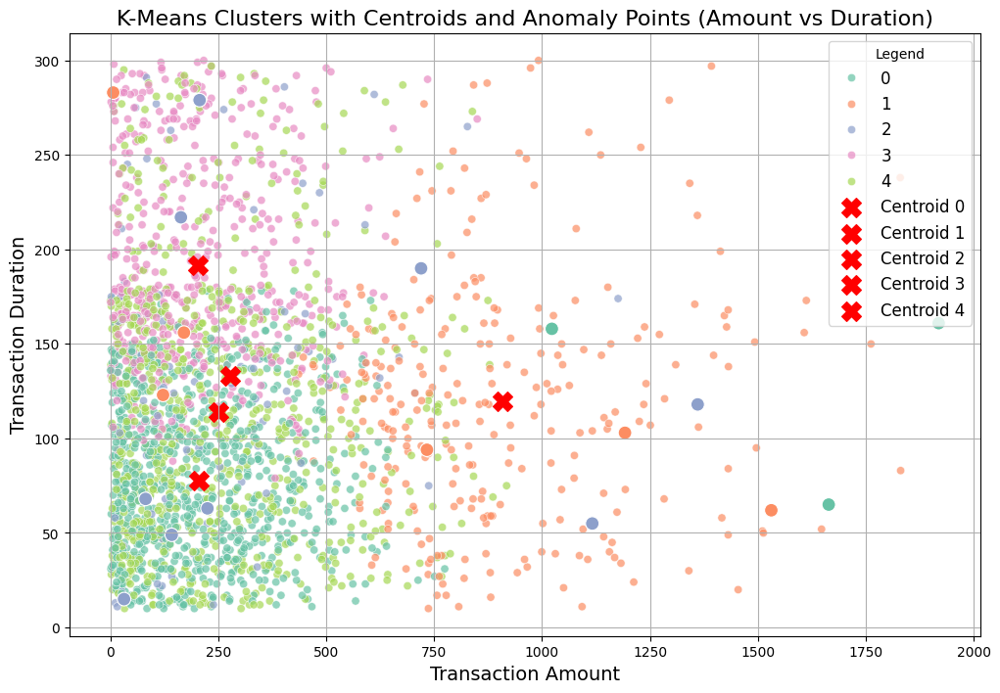

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/204502653.py:113: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  sns.scatterplot(


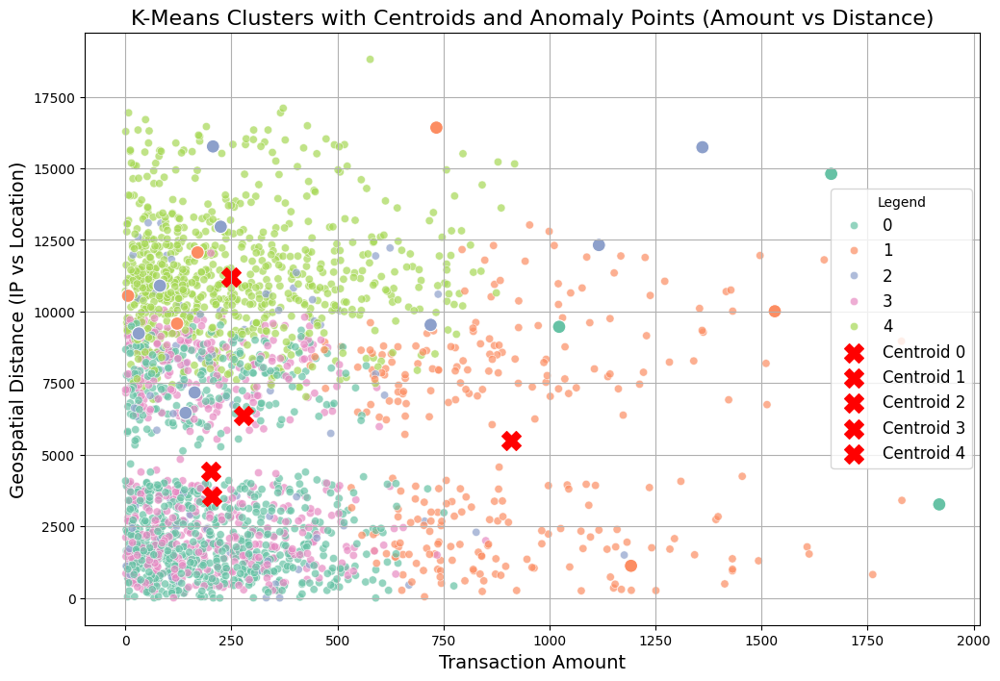

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/204502653.py:154: UserWarning: The palette list has more values (5) than needed (3), which may not be intended.
  sns.scatterplot(


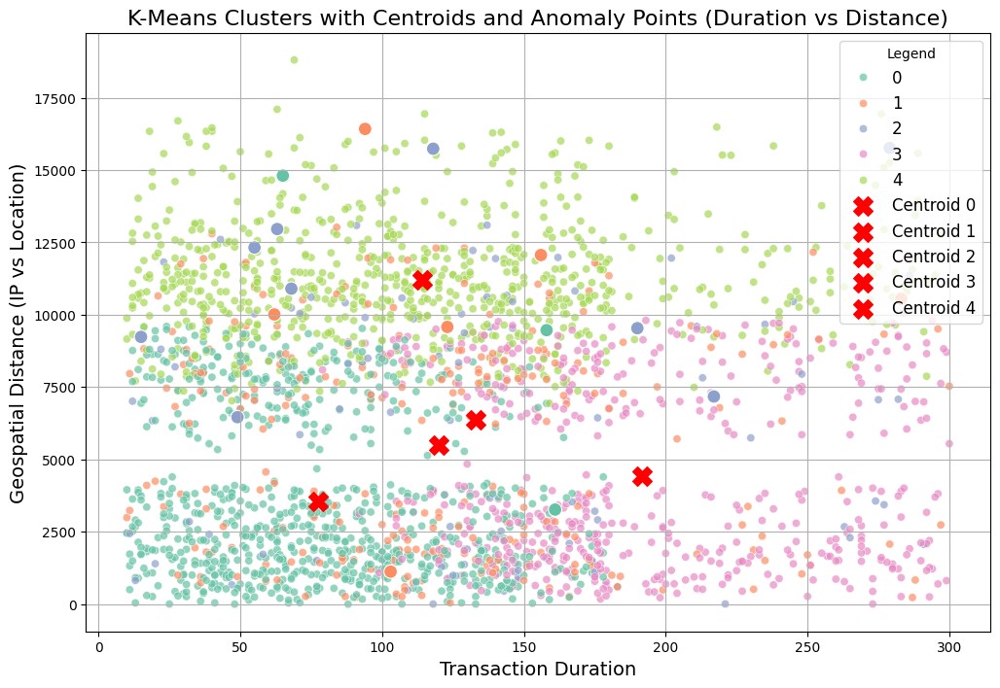

Total Fraudulent Transactions Detected (Using K Means clustering): 18
Fraudulent transactions saved to: ../output/kmeans_fraud_transactions.csv
Fraudulent Transactions Detected:
     TransactionID AccountID  TransactionAmount     TransactionDate  \
356       TX000357   AC00261             121.82 2023-02-07 17:20:24   
394       TX000395   AC00326               6.30 2023-12-14 18:52:54   
471       TX000472   AC00398             206.46 2023-11-27 18:26:02   
511       TX000512   AC00153            1116.48 2023-09-18 17:44:50   
653       TX000654   AC00423            1919.11 2023-06-27 17:48:25   
693       TX000694   AC00011             733.29 2023-03-15 18:42:16   
833       TX000834   AC00307              81.27 2023-11-07 16:36:34   
898       TX000899   AC00083            1531.31 2023-10-23 18:00:29   
934       TX000935   AC00456            1022.75 2023-01-19 16:45:16   
1177      TX001178   AC00211             224.73 2023-02-09 16:27:52   
1210      TX001211   AC00428             

In [10]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Exclude the 'AccountBalance' column due to context constraints
numeric_cols = ['TransactionAmount', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 'TimeSinceLastTransaction', 'distance_loc_ip', 'location_lat', 'location_lon', 'ip_lat', 'ip_lon']

# Standardize numeric columns for clustering
scaler = StandardScaler()
numeric_scaled = pd.DataFrame(scaler.fit_transform(data[numeric_cols]), columns=numeric_cols)

# Perform K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # Number of clusters can be adjusted
kmeans_labels = kmeans.fit_predict(numeric_scaled)
data['KMeans_Cluster'] = kmeans_labels

# Calculate distances from centroids
centroids = kmeans.cluster_centers_
distances = np.linalg.norm(numeric_scaled.values - centroids[kmeans_labels], axis=1)
data['KMeans_Distance'] = distances

# Set threshold: Mean + 3 * Standard Deviation
threshold = distances.mean() + 3 * distances.std()
data['KMeans_Fraud'] = distances > threshold

# Summary of flagged anomalies
fraud_summary = data['KMeans_Fraud'].value_counts()
print(f"Threshold: {threshold}")
print(f"Fraud summary: {fraud_summary}")
print(f"First few rows of flagged transactions:\n", data[['TransactionAmount', 'KMeans_Distance', 'KMeans_Fraud']].head())

# Calculate centroids and scale them back to the original feature space
centroids_scaled = kmeans.cluster_centers_
centroids_original = scaler.inverse_transform(centroids_scaled)

# Add an anomaly detection logic (using distance from centroids)
distances = np.linalg.norm(numeric_scaled - centroids_scaled[kmeans_labels], axis=1)
threshold = distances.mean() + 3 * distances.std()
data['Fraud'] = distances > threshold
data['KMeans_Distance'] = distances

# Set custom color palette for clusters and fraud points
cluster_palette = sns.color_palette("Set2", n_colors=5)  # 5 distinct colors for 5 clusters

# Scatterplot 1: Transaction Amount vs Transaction Duration
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=data['TransactionAmount'],
    y=data['TransactionDuration'],
    hue=data['KMeans_Cluster'],  # Cluster colors
    palette=cluster_palette,
    alpha=0.7,
    legend='full'
)

# Overlay centroids on the scatterplot
for i, centroid in enumerate(centroids_original):
    plt.scatter(
        centroid[numeric_cols.index('TransactionAmount')],
        centroid[numeric_cols.index('TransactionDuration')],
        color='red',
        marker='X',
        s=200,
        label=f'Centroid {i}'
    )

# Highlight anomalies with a vivid color matching their cluster
fraud_points = data[data['Fraud']]
sns.scatterplot(
    x=fraud_points['TransactionAmount'],
    y=fraud_points['TransactionDuration'],
    hue=fraud_points['KMeans_Cluster'],  # Anomaly points colored by their cluster
    palette=cluster_palette,  # Match cluster colors
    marker='o',
    s=100,
    legend=False  # No need to show the legend again
)

plt.title('K-Means Clusters with Centroids and Anomaly Points (Amount vs Duration)', fontsize=16)
plt.xlabel('Transaction Amount', fontsize=14)
plt.ylabel('Transaction Duration', fontsize=14)
plt.legend(title='Legend', fontsize=12)
plt.grid(True)
plt.show()

# Scatterplot 2: Transaction Amount vs Geospatial Distance (IP vs Location)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=data['TransactionAmount'],
    y=data['distance_loc_ip'], 
    hue=data['KMeans_Cluster'],  # Cluster colors
    palette=cluster_palette,
    alpha=0.7,
    legend='full'
)

# Overlay centroids on the scatterplot
for i, centroid in enumerate(centroids_original):
    plt.scatter(
        centroid[numeric_cols.index('TransactionAmount')],
        centroid[numeric_cols.index('distance_loc_ip')], 
        color='red',
        marker='X',
        s=200,
        label=f'Centroid {i}'
    )

# Highlight fraud points (anomalies) with a vivid color matching their cluster
fraud_points = data[data['Fraud']]
sns.scatterplot(
    x=fraud_points['TransactionAmount'],
    y=fraud_points['distance_loc_ip'],
    hue=fraud_points['KMeans_Cluster'],  # Fraud points colored by their cluster
    palette=cluster_palette,  # Match cluster colors
    marker='o',
    s=100,
    legend=False  # No need to show the legend again
)

plt.title('K-Means Clusters with Centroids and Anomaly Points (Amount vs Distance)', fontsize=16)
plt.xlabel('Transaction Amount', fontsize=14)
plt.ylabel('Geospatial Distance (IP vs Location)', fontsize=14)
plt.legend(title='Legend', fontsize=12)
plt.grid(True)
plt.show()

# Scatterplot 3: Transaction Duration vs Geospatial Distance (IP vs Location)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=data['TransactionDuration'],
    y=data['distance_loc_ip'], 
    hue=data['KMeans_Cluster'],  
    palette=cluster_palette,
    alpha=0.7,
    legend='full'
)

# Overlay centroids on the scatterplot
for i, centroid in enumerate(centroids_original):
    plt.scatter(
        centroid[numeric_cols.index('TransactionDuration')],
        centroid[numeric_cols.index('distance_loc_ip')],  
        color='red',
        marker='X',
        s=200,
        label=f'Centroid {i}'
    )

# Highlight anomalies with a vivid color matching their cluster
fraud_points = data[data['Fraud']]
sns.scatterplot(
    x=fraud_points['TransactionDuration'],
    y=fraud_points['distance_loc_ip'], 
    hue=fraud_points['KMeans_Cluster'],  # Fraud points colored by their cluster
    palette=cluster_palette,  # Match cluster colors
    marker='o',
    s=100,
    legend=False  # No need to show the legend again
)

plt.title('K-Means Clusters with Centroids and Anomaly Points (Duration vs Distance)', fontsize=16)
plt.xlabel('Transaction Duration', fontsize=14)
plt.ylabel('Geospatial Distance (IP vs Location)', fontsize=14)
plt.legend(title='Legend', fontsize=12)
plt.grid(True)
plt.show()

# Save fraud transactions to a separate CSV file
fraud_output_path = '../output/kmeans_fraud_transactions.csv'
fraud_points.to_csv(fraud_output_path, index=False)

# Print summary of fraud points
total_fraud_points = data['Fraud'].sum()
print(f"Total Fraudulent Transactions Detected (Using K Means clustering): {total_fraud_points}")
print(f"Fraudulent transactions saved to: {fraud_output_path}")

# Display fraud transactions
print("Fraudulent Transactions Detected:")
print(fraud_points)


## **2. Z-Score Analysis**
### Flags extreme outliers in numeric features.

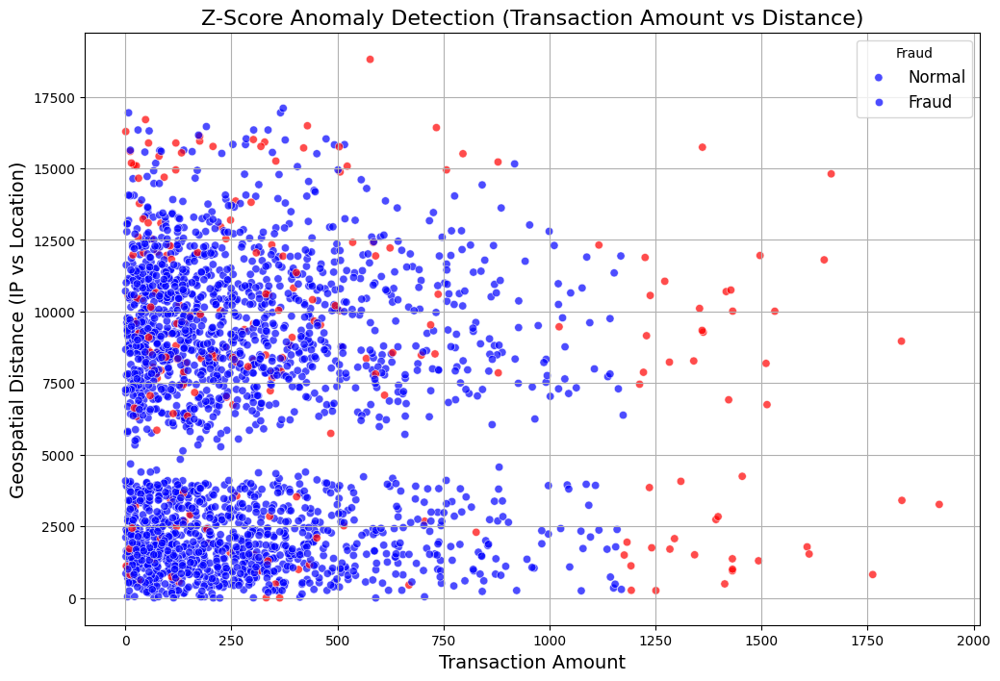

Total Fraudulent Transactions Detected by Z-Score Analysis: 223
Fraudulent transactions saved to: ../output/zscore_fraud_transactions.csv
     TransactionID AccountID  TransactionAmount     TransactionDate  \
23        TX000024   AC00453             345.84 2023-05-02 18:25:46   
26        TX000027   AC00441             246.93 2023-04-17 16:37:01   
32        TX000033   AC00060             396.45 2023-09-25 16:26:00   
47        TX000048   AC00439             510.24 2023-10-09 16:29:40   
54        TX000055   AC00419             104.63 2023-03-29 17:47:16   
...            ...       ...                ...                 ...   
2423      TX002424   AC00340             332.06 2023-06-21 16:38:54   
2445      TX002446   AC00439             403.01 2023-09-04 17:32:35   
2446      TX002447   AC00014             719.76 2023-03-30 17:50:23   
2447      TX002448   AC00140             163.22 2023-04-06 18:06:12   
2505      TX002506   AC00377             577.12 2023-01-27 17:38:07   

     Tran

In [11]:
from scipy.stats import zscore
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define numeric columns 
numeric_cols = ['TransactionAmount', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 'TimeSinceLastTransaction', 'distance_loc_ip', 'location_lat', 'location_lon', 'ip_lat', 'ip_lon']

# Calculate Z-Scores for all numeric columns
z_scores = np.abs(zscore(data[numeric_cols]))
data['ZScore_Fraud'] = (z_scores > 3).any(axis=1)  # Flag transactions where any feature exceeds |z| > 3

# Extract fraudulent transactions
zscore_fraud_points = data[data['ZScore_Fraud']]

# Summary of results
total_zscore_fraud_points = data['ZScore_Fraud'].sum()
zscore_fraud_points_summary = zscore_fraud_points[numeric_cols + ['ZScore_Fraud']]

# Adding True values to Fraud column
data['Fraud'] |= data['ZScore_Fraud']

# Scatterplot for Z-Score fraud detection (Transaction Amount vs. Distance from IP and Location)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=data['TransactionAmount'],
    y=data['distance_loc_ip'],  # Use distance between IP and location as the Y-axis
    hue=data['ZScore_Fraud'],
    palette={True: 'red', False: 'blue'},
    alpha=0.7
)
plt.title('Z-Score Anomaly Detection (Transaction Amount vs Distance)', fontsize=16)
plt.xlabel('Transaction Amount', fontsize=14)
plt.ylabel('Geospatial Distance (IP vs Location)', fontsize=14)
plt.legend(title='Fraud', labels=['Normal', 'Fraud'], fontsize=12)
plt.grid(True)
plt.show()

# Save fraudulent transactions detected by Z-Score analysis
zscore_fraud_output_path = '../output/zscore_fraud_transactions.csv'
zscore_fraud_points.to_csv(zscore_fraud_output_path, index=False)

# Summary
print(f"Total Fraudulent Transactions Detected by Z-Score Analysis: {total_zscore_fraud_points}")
print(f"Fraudulent transactions saved to: {zscore_fraud_output_path}")
print(zscore_fraud_points)

## **3. Isolation Forest**
### Highlights anomalous transactions using tree-based partitioning.

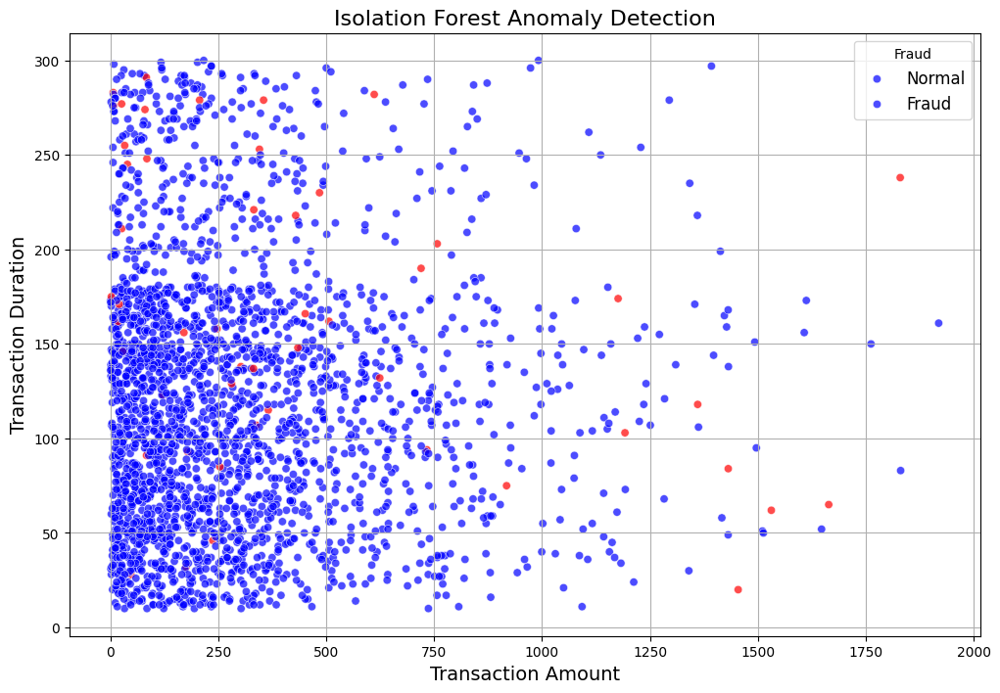

Total Fraudulent Transactions Detected (using Isolation Forest): 50
Fraudulent transactions saved to: ../output/iso_forest_fraud_transactions.csv


In [12]:
from sklearn.ensemble import IsolationForest
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore", category=FutureWarning)

# Define numeric columns relevant to the analysis
numeric_cols = ['TransactionAmount', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 'TimeSinceLastTransaction', 'distance_loc_ip', 'location_lat', 'location_lon', 'ip_lat', 'ip_lon']

# Standardize the numeric columns before applying Isolation Forest
scaler = StandardScaler()
numeric_scaled = pd.DataFrame(scaler.fit_transform(data[numeric_cols]), columns=numeric_cols)

# Apply Isolation Forest with contamination (expected anomaly rate)
iso_forest = IsolationForest(contamination=0.02, random_state=42)  # Set contamination rate to 2%
iso_forest.fit(numeric_scaled)  # Fit on the scaled numeric data

# Predict anomalies using Isolation Forest
data['IsoForest_Score'] = iso_forest.decision_function(numeric_scaled)
data['IsoForest_Fraud'] = iso_forest.predict(numeric_scaled) == -1  # Mark anomalies (-1) as fraud

# Extract fraudulent transactions based on Isolation Forest's prediction
iso_fraud_points = data[data['IsoForest_Fraud']]

# Summary of the Isolation Forest results
total_iso_fraud_points = data['IsoForest_Fraud'].sum()
iso_fraud_points_summary = iso_fraud_points[['TransactionAmount', 'TransactionDuration', 'IsoForest_Fraud']]

# Add the detected fraud to the final Fraud column (combining results from previous models)
data['Fraud'] |= data['IsoForest_Fraud']

# Visualize the results with a scatterplot (Transaction Amount vs Transaction Duration)
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=data['TransactionAmount'],
    y=data['TransactionDuration'],
    hue=data['IsoForest_Fraud'],  # Color based on whether it's flagged as fraud
    palette={True: 'red', False: 'blue'},  # Fraud points in red, non-fraud points in blue
    alpha=0.7
)
plt.title('Isolation Forest Anomaly Detection', fontsize=16)
plt.xlabel('Transaction Amount', fontsize=14)
plt.ylabel('Transaction Duration', fontsize=14)
plt.legend(title='Fraud', labels=['Normal', 'Fraud'], fontsize=12)
plt.grid(True)
plt.show()

# Outputs and save fraud transactions detected by Isolation Forest
fraud_output_path = '../output/iso_forest_fraud_transactions.csv'
iso_fraud_points.to_csv(fraud_output_path, index=False)

# Print the summary
print(f"Total Fraudulent Transactions Detected (using Isolation Forest): {total_iso_fraud_points}")
print(f"Fraudulent transactions saved to: {fraud_output_path}")

## **4. Logistic Regression**
### Classifies transactions as fraud or non-fraud using supervised learning.


Classification Report:
              precision    recall  f1-score   support

       False       0.97      0.99      0.98       681
        True       0.89      0.68      0.77        69

    accuracy                           0.96       750
   macro avg       0.93      0.84      0.88       750
weighted avg       0.96      0.96      0.96       750



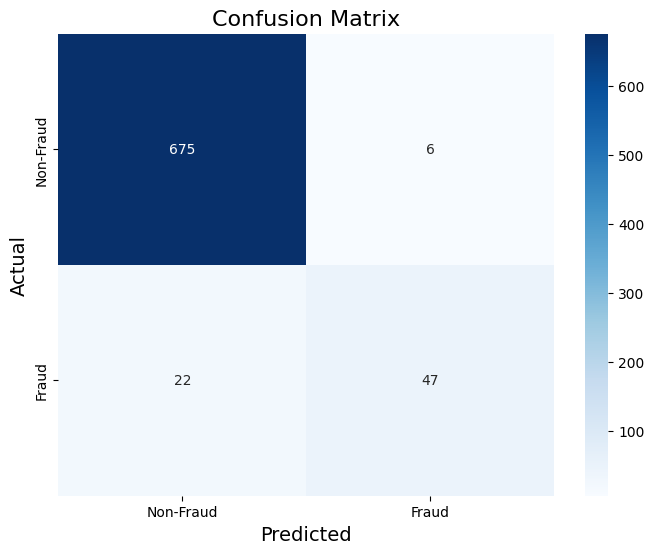

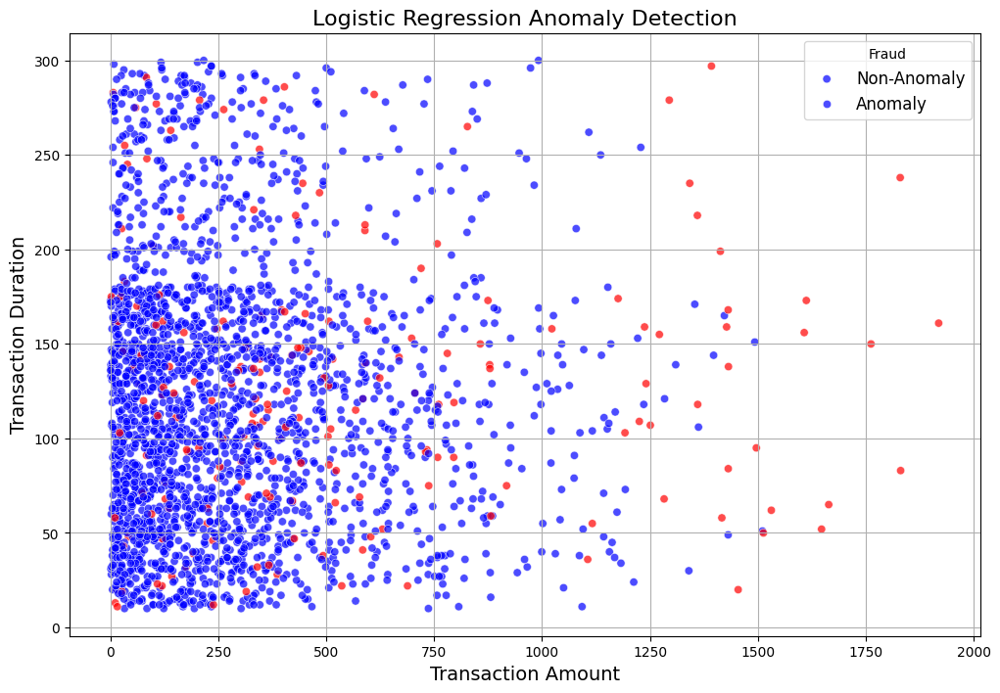

Total Fraudulent Transactions Detected by Logistic Regression: 198
Fraudulent transactions saved to: ../output/log_reg_fraud_transactions.csv
     TransactionID AccountID  TransactionAmount     TransactionDate  \
23        TX000024   AC00453             345.84 2023-05-02 18:25:46   
26        TX000027   AC00441             246.93 2023-04-17 16:37:01   
32        TX000033   AC00060             396.45 2023-09-25 16:26:00   
38        TX000039   AC00478             795.31 2023-10-12 17:07:40   
47        TX000048   AC00439             510.24 2023-10-09 16:29:40   
...            ...       ...                ...                 ...   
2446      TX002447   AC00014             719.76 2023-03-30 17:50:23   
2447      TX002448   AC00140             163.22 2023-04-06 18:06:12   
2470      TX002471   AC00128             425.91 2023-03-24 16:34:27   
2493      TX002494   AC00279             856.90 2023-03-17 16:10:35   
2505      TX002506   AC00377             577.12 2023-01-27 17:38:07   

     

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Define relevant columns for logistic regression (including geospatial and other numeric features)
features = ['TransactionAmount', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 'TimeSinceLastTransaction', 'distance_loc_ip', 'location_lat', 'location_lon', 'ip_lat', 'ip_lon']
target = 'Fraud'

# Prepare the dataset
X = data[features]
y = data[target]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Train Logistic Regression model
log_reg = LogisticRegression(random_state=42)
log_reg.fit(X_train, y_train)

# Predict fraud on the test set
y_pred = log_reg.predict(X_test)

# Evaluate model performance
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['Non-Fraud', 'Fraud'], yticklabels=['Non-Fraud', 'Fraud'])
plt.title('Confusion Matrix', fontsize=16)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('Actual', fontsize=14)
plt.show()

# Add predictions to the dataset
data['LogReg_Fraud'] = log_reg.predict(X_scaled)
data['Fraud'] |= data['LogReg_Fraud']

# Visualize fraud vs. non-fraud transactions
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=data['TransactionAmount'],
    y=data['TransactionDuration'],
    hue=data['LogReg_Fraud'],  # Use the predicted fraud labels from Logistic Regression
    palette={1: 'red', 0: 'blue'},  # 1 (Fraud) in red, 0 (Non-Fraud) in blue
    alpha=0.7
)
plt.title('Logistic Regression Anomaly Detection', fontsize=16)
plt.xlabel('Transaction Amount', fontsize=14)
plt.ylabel('Transaction Duration', fontsize=14)
plt.legend(title='Fraud', labels=['Non-Anomaly', 'Anomaly'], fontsize=12)
plt.grid(True)
plt.show()

# Save fraudulent transactions detected by Logistic Regression
log_reg_fraud_output_path = '../output/log_reg_fraud_transactions.csv'  # Adjust path as needed
log_reg_fraud_points = data[data['LogReg_Fraud'] == 1]
log_reg_fraud_points.to_csv(log_reg_fraud_output_path, index=False)

# Summary
total_log_reg_fraud_points = log_reg_fraud_points.shape[0]
print(f"Total Fraudulent Transactions Detected by Logistic Regression: {total_log_reg_fraud_points}")
print(f"Fraudulent transactions saved to: {log_reg_fraud_output_path}")
print(log_reg_fraud_points)

# **Coefficient Table**
# Access the coefficients of the trained logistic regression model
coef = log_reg.coef_[0]  # Get the coefficients of the logistic regression model (for binary classification)
features = features  # List of feature names (as you defined in your code)

# Create a DataFrame to visualize the feature importance
coef_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coef,
    'Importance': np.abs(coef)  # Absolute value of coefficient can be used to see the feature importance
})

# Sort the features by importance
coef_df = coef_df.sort_values(by='Importance', ascending=False)

# Display the table
print("\nLogistic Regression Coefficient Table (Feature Importance):")
print(coef_df)

## LIME (Local Interpretable Model-Agnostic Explanations)

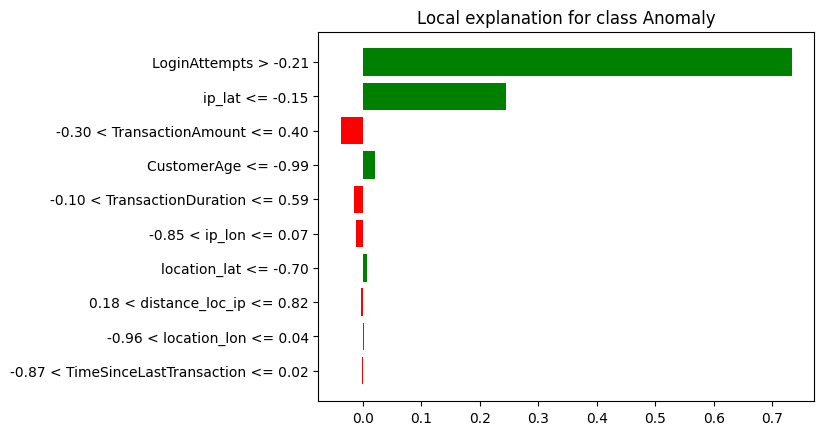

Explanation of the Instance:
[('LoginAttempts > -0.21', 0.7338090329547565), ('ip_lat <= -0.15', 0.24543176384332854), ('-0.30 < TransactionAmount <= 0.40', -0.03698920767822492), ('CustomerAge <= -0.99', 0.021012320297995584), ('-0.10 < TransactionDuration <= 0.59', -0.014941507156058813), ('-0.85 < ip_lon <= 0.07', -0.010995440530307992), ('location_lat <= -0.70', 0.006587410529285055), ('0.18 < distance_loc_ip <= 0.82', -0.0035853954913736205), ('-0.96 < location_lon <= 0.04', 0.002238111300990099), ('-0.87 < TimeSinceLastTransaction <= 0.02', -0.0019300362876029495)]


In [14]:
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
import numpy as np

# Define the features used in Logistic Regression model (same as before)
features = ['TransactionAmount', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 'TimeSinceLastTransaction', 'distance_loc_ip', 'location_lat', 'location_lon', 'ip_lat', 'ip_lon']

# Prepare the data
X = data[features]
y = data['Fraud']

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train the Logistic Regression model
log_reg = LogisticRegression(random_state=23)
log_reg.fit(X_scaled, y)

# Create the LIME explainer for tabular data
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_scaled,
    feature_names=features,
    class_names=['Non-Anomaly', 'Anomaly'],
    mode='classification',
    discretize_continuous=True # this is optional to discretize bins
)

# Choose a sample instance to explain
sample_instance = X_scaled[23]  # randomly chosen 23

# Explain the prediction for the sample instance
explanation = explainer.explain_instance(sample_instance, log_reg.predict_proba)

# Set the style for white background (if using IDE dark mode)
plt.rcParams['figure.facecolor'] = 'white'
explanation.show_in_notebook()

# Alternatively, plot the explanation to visualize feature importance
explanation.as_pyplot_figure()
plt.show()

# Print the detailed explanation to understand the impact of each feature
print("Explanation of the Instance:")
print(explanation.as_list())

---
# Consolidated Fraud Analysis
---
Using the statistical analysis methods, we deduce all the potential fraud transactions and showcase them.

We further assign a continuous metric for Risk Score and visualize anomalies with different colors based on it.

Results show great significance of geospatial features in determining transactional Risk Score.

Total Fraudulent Transactions Detected: 253


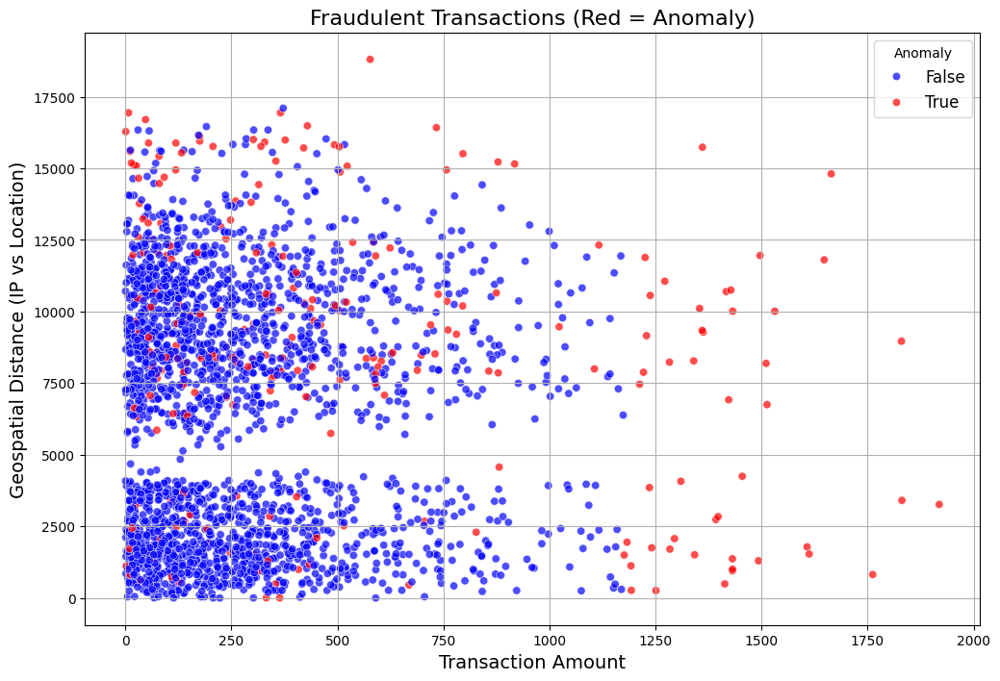

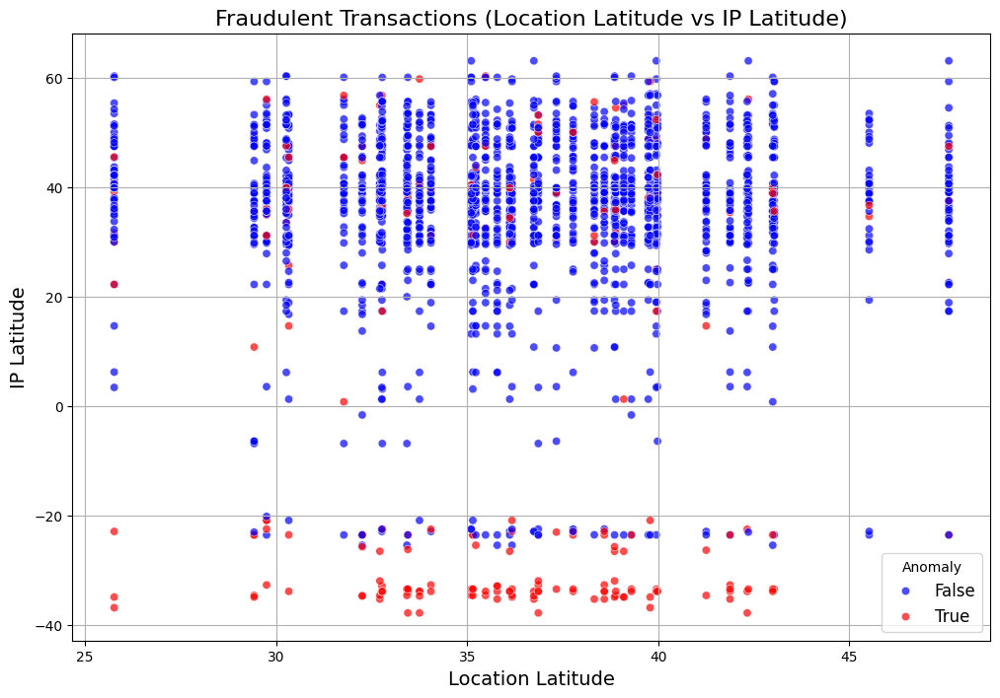

Results saved to ../output/fraud_detection_results.csv
     TransactionID AccountID  TransactionAmount     TransactionDate  \
23        TX000024   AC00453             345.84 2023-05-02 18:25:46   
25        TX000026   AC00041               7.49 2023-10-20 17:53:13   
26        TX000027   AC00441             246.93 2023-04-17 16:37:01   
32        TX000033   AC00060             396.45 2023-09-25 16:26:00   
38        TX000039   AC00478             795.31 2023-10-12 17:07:40   
...            ...       ...                ...                 ...   
2447      TX002448   AC00140             163.22 2023-04-06 18:06:12   
2457      TX002458   AC00315              79.92 2023-02-06 17:32:11   
2470      TX002471   AC00128             425.91 2023-03-24 16:34:27   
2493      TX002494   AC00279             856.90 2023-03-17 16:10:35   
2505      TX002506   AC00377             577.12 2023-01-27 17:38:07   

     TransactionType        Location DeviceID       IP Address MerchantID  \
23             

In [15]:
# Summary of fraud detection results
print(f"Total Fraudulent Transactions Detected: {data['Fraud'].sum()}")

# Visualize fraudulent transactions
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='TransactionAmount',  # Transaction amount as the x-axis
    y='distance_loc_ip',  # Distance between IP and Location as the y-axis
    hue='Fraud',  # Fraud status as hue
    data=data, 
    palette={True: 'red', False: 'blue'},  # Fraud is red, Non-Fraud is blue
    alpha=0.7
)
plt.title('Fraudulent Transactions (Red = Anomaly)', fontsize=16)
plt.xlabel('Transaction Amount', fontsize=14)
plt.ylabel('Geospatial Distance (IP vs Location)', fontsize=14)
plt.legend(title='Anomaly', fontsize=12)
plt.grid(True)
plt.show()

# Scatterplot 2: Location Latitude vs IP Latitude
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='location_lat',  # Location Latitude for x-axis
    y='ip_lat',  # IP Latitude for y-axis
    hue='Fraud',  # Fraud status as hue
    data=data, 
    palette={True: 'red', False: 'blue'},  # Fraud is red, Non-Fraud is blue
    alpha=0.7
)
plt.title('Fraudulent Transactions (Location Latitude vs IP Latitude)', fontsize=16)
plt.xlabel('Location Latitude', fontsize=14)
plt.ylabel('IP Latitude', fontsize=14)
plt.legend(title='Anomaly', fontsize=12)
plt.grid(True)
plt.show()

# Save the results to a CSV file
output_path = '../output/fraud_detection_results.csv' 
data.to_csv(output_path, index=False)
print(f"Results saved to {output_path}")

# Filter the DataFrame for rows where 'Fraud' is True
fraud_rows = data[data['Fraud'] == True]

# Print the filtered rows (fraudulent transactions)
print(fraud_rows)

# Print total number of fraudulent transactions
total_fraud_transactions = fraud_rows.shape[0]
print(f"Total number of fraudulent transactions: {total_fraud_transactions}")

/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3509944819.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraud_rows['KMeans_Fraud_Norm'] = (fraud_rows['KMeans_Distance'] - fraud_rows['KMeans_Distance'].min()) / (fraud_rows['KMeans_Distance'].max() - fraud_rows['KMeans_Distance'].min())
/var/folders/_v/r8ctjl_n58z4zpkpm53_7m480000gn/T/ipykernel_61039/3509944819.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fraud_rows['IsoForest_Fraud_Norm'] = (fraud_rows['IsoForest_Score'] - frau

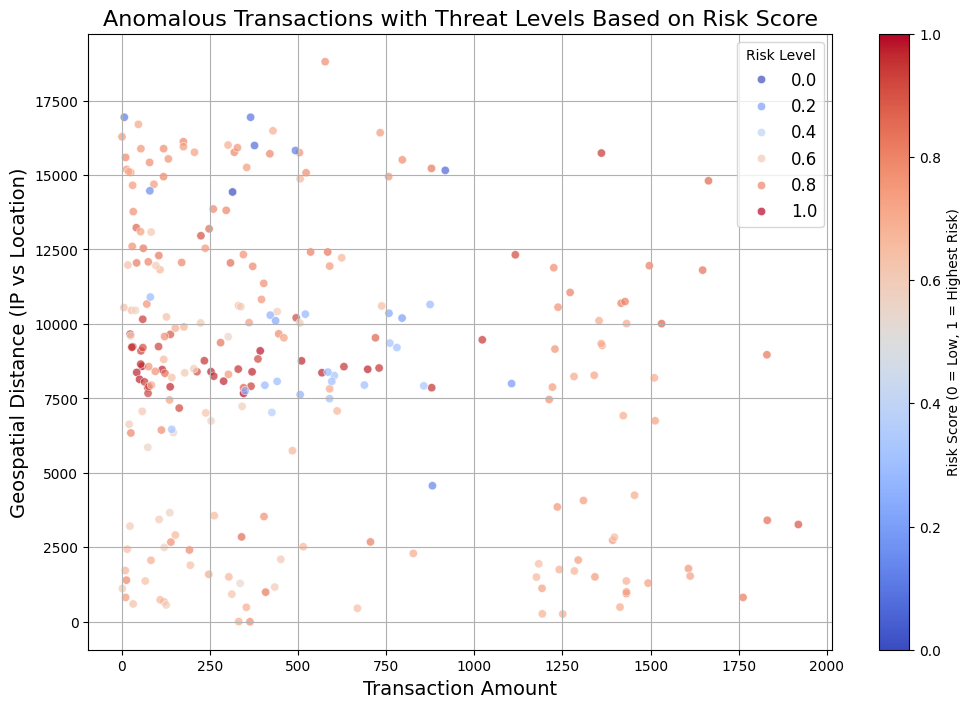

Top rows with the highest risk scores:
      TransactionAmount  distance_loc_ip  Fraud_Score  Fraud_Score_Norm
526              345.81      7671.200023     0.802354          1.000000
2041              58.23      8580.953963     0.796525          0.989195
89               392.96      9096.394171     0.795361          0.987035
925              697.82      8477.751380     0.789669          0.976483
617              115.11      8466.454164     0.789644          0.976436


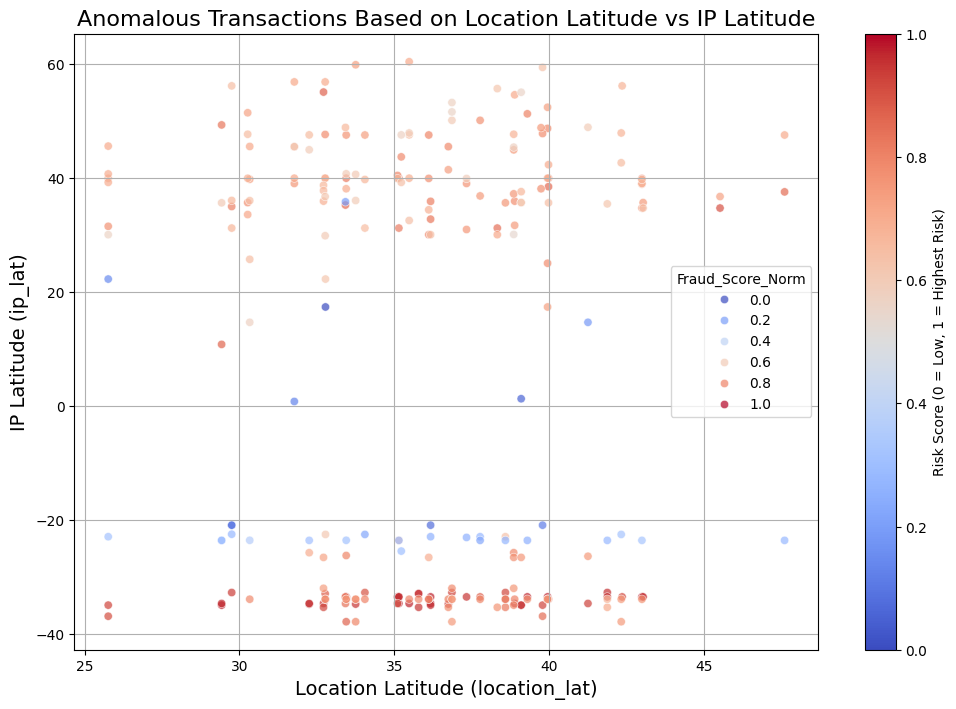

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Normalize the model outputs to range [0, 1] for continuous fraud scores
fraud_rows['KMeans_Fraud_Norm'] = (fraud_rows['KMeans_Distance'] - fraud_rows['KMeans_Distance'].min()) / (fraud_rows['KMeans_Distance'].max() - fraud_rows['KMeans_Distance'].min())
fraud_rows['IsoForest_Fraud_Norm'] = (fraud_rows['IsoForest_Score'] - fraud_rows['IsoForest_Score'].min()) / (fraud_rows['IsoForest_Score'].max() - fraud_rows['IsoForest_Score'].min())

# Convert ZScore_Fraud to numeric (True=1, False=0) for the fraud score calculation
fraud_rows['ZScore_Fraud_Norm'] = fraud_rows['ZScore_Fraud'].astype(int)

# Calculate the combined Fraud Score
fraud_rows['Fraud_Score'] = fraud_rows[['KMeans_Fraud_Norm', 'IsoForest_Fraud_Norm', 'ZScore_Fraud_Norm']].mean(axis=1)  # Mean of normalized fraud scores

# Normalize the overall fraud score to the [0, 1] range
fraud_rows['Fraud_Score_Norm'] = (fraud_rows['Fraud_Score'] - fraud_rows['Fraud_Score'].min()) / (fraud_rows['Fraud_Score'].max() - fraud_rows['Fraud_Score'].min())

# Sort rows by Fraud_Score (in descending order)
sorted_data = fraud_rows.sort_values(by='Fraud_Score', ascending=False)

# Set a colormap to map the fraud scores to color shades
plt.figure(figsize=(12, 8))

# Create the scatterplot with custom color mapping
scatter = sns.scatterplot(
    x=sorted_data['TransactionAmount'],
    y=sorted_data['distance_loc_ip'],  
    hue=sorted_data['Fraud_Score_Norm'], 
    palette='coolwarm',  # Using a cool-to-warm color palette for severity
    alpha=0.7
)

# Highlight normal transactions in blue (Fraud_Score == 0)
normal_transactions = sorted_data[sorted_data['Fraud_Score'] == 0]  # Normal transactions have score = 0
sns.scatterplot(
    x=normal_transactions['TransactionAmount'],
    y=normal_transactions['distance_loc_ip'], 
    color='blue',  # Blue for normal transactions
    alpha=0.7,
    label='Normal'
)

# Add color bar to show the scale of fraud scores
norm = plt.Normalize(vmin=0, vmax=1)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])  # empty array for colorbar
cbar = plt.colorbar(sm, ax=plt.gca())
cbar.set_label('Risk Score (0 = Low, 1 = Highest Risk)')

# Define risk levels based on the fraud score range
bins = [0, 0.25, 0.5, 0.75, 1]
labels = ['Low', 'Medium', 'High', 'Critical']

# Add the legend to show the defined risk levels
scatter.legend_.set_title('Risk Level')
for t, l in zip(scatter.legend_.texts, labels):
    t.set_text(l)

plt.title('Anomalous Transactions with Threat Levels Based on Risk Score', fontsize=16)
plt.xlabel('Transaction Amount', fontsize=14)
plt.ylabel('Geospatial Distance (IP vs Location)', fontsize=14)
plt.legend(title='Risk Level', fontsize=12)
plt.grid(True)

# Now that the plot is set, we can explicitly draw the colorbar with the appropriate values
plt.show()

# Display the top rows based on the highest fraud scores
print(f"Top rows with the highest risk scores:")
print(sorted_data[['TransactionAmount', 'distance_loc_ip', 'Fraud_Score', 'Fraud_Score_Norm']].head())

# Scatterplot for Location Latitude vs IP Latitude (location_lat vs ip_lat)
plt.figure(figsize=(12, 8))

# Create scatterplot for Location Latitude vs IP Latitude
sns.scatterplot(
    x=sorted_data['location_lat'],  # Location Latitude for x-axis
    y=sorted_data['ip_lat'],  # IP Latitude for y-axis
    hue=sorted_data['Fraud_Score_Norm'],  # Color based on the normalized fraud score
    palette='coolwarm',  # Using a cool-to-warm color palette for severity
    alpha=0.7
)

# Add color bar to show the scale of fraud scores
cbar = plt.colorbar(sm, ax=plt.gca())
cbar.set_label('Risk Score (0 = Low, 1 = Highest Risk)')

plt.title('Anomalous Transactions Based on Location Latitude vs IP Latitude', fontsize=16)
plt.xlabel('Location Latitude (location_lat)', fontsize=14)
plt.ylabel('IP Latitude (ip_lat)', fontsize=14)
plt.grid(True)

# Display
plt.show()

# Final considerations over correlations of numeric features

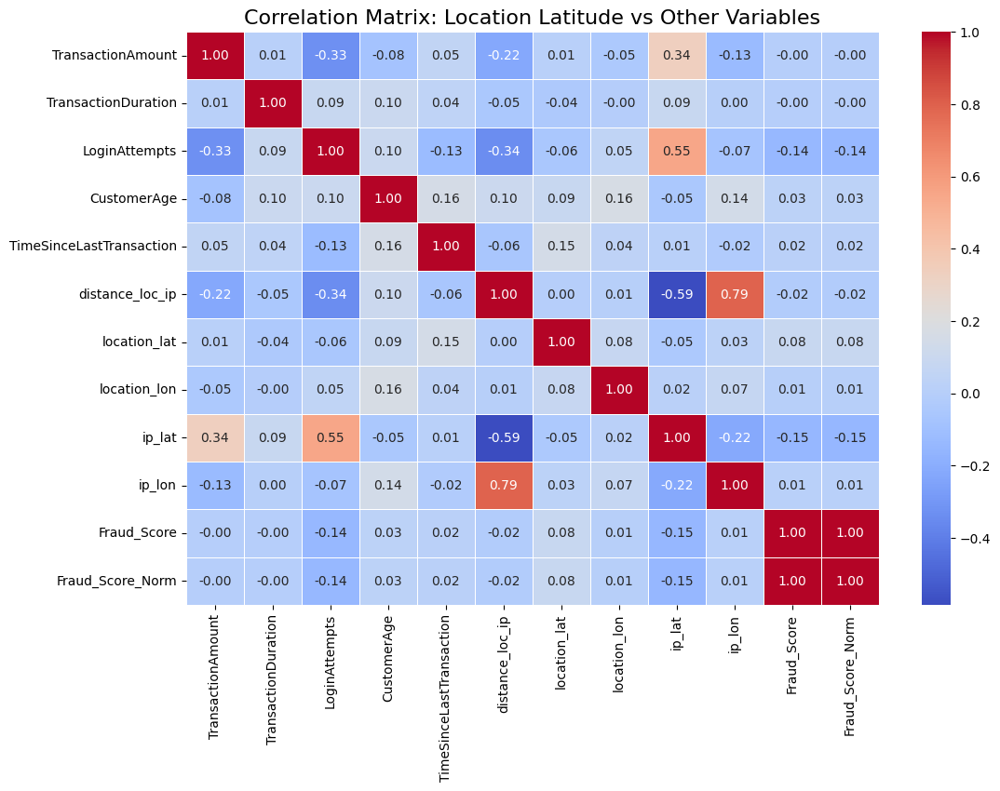

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure we are working with the correct numeric columns
numeric_cols = ['TransactionAmount', 'TransactionDuration', 'LoginAttempts', 'CustomerAge', 
                'TimeSinceLastTransaction', 'distance_loc_ip', 'location_lat', 'location_lon', 
                'ip_lat', 'ip_lon', 'Fraud_Score', 'Fraud_Score_Norm']

# Create the correlation matrix for location_lat vs all other numeric variables
correlation_matrix = fraud_rows[numeric_cols].corr()

# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix: Location Latitude vs Other Variables', fontsize=16)
plt.show()

## **Highest Risk Transactions**
Showcasing the 20 transactions with the highest assigned Risk Score, and their key features.

In [18]:
import pandas as pd

# Sort the data by fraud score (descending order)
sorted_fraud_data = fraud_rows.sort_values(by='Fraud_Score', ascending=False)

# Select the top 20 transactions based on the Fraud Score
top_20_data = sorted_fraud_data.head(20)

# Display the top 20 transactions with relevant features
top_20_table = top_20_data[['TransactionID', 'TransactionAmount', 'Location', 'distance_loc_ip', 'Fraud_Score', 
                             'LoginAttempts', 'location_lat', 'ip_lat', 'TransactionDuration', 'CustomerAge']]

# Print the top 20 table
print("Top 20 Transactions by Fraud Score:")
print(top_20_table)

Top 20 Transactions by Fraud Score:
     TransactionID  TransactionAmount       Location  distance_loc_ip  \
526       TX000527             345.81        Raleigh      7671.200023   
2041      TX002042              58.23        Phoenix      8580.953963   
89        TX000090             392.96    Kansas City      9096.394171   
925       TX000926             697.82       New York      8477.751380   
617       TX000618             115.11    Albuquerque      8466.454164   
1140      TX001141              42.72      Nashville      8372.292250   
645       TX000646              50.83   Philadelphia      8140.975122   
1600      TX001601             369.89    San Antonio      8391.628029   
1787      TX001788             253.46        Memphis      8396.313035   
1240      TX001241             137.59      Nashville      7888.655556   
1185      TX001186              74.27        Memphis      7859.493283   
47        TX000048             510.24  Oklahoma City      8760.956755   
1744      TX001

# Conclusions
The anomaly detection project successfully combines statistical and machine learning techniques to identify potential fraudulent transactions in a dataset of 2,500 records. Through thorough data preprocessing, feature engineering, and comprehensive analyses, four anomaly detection methods—K-Means Clustering, Z-Score Analysis, Isolation Forest, and Logistic Regression—were implemented. These methods were combined to generate a continuous Fraud Risk Score, prioritizing transactions based on their likelihood of being fraudulent given their anomalous nature.

The project also emphasizes interpretability by providing clear, color-coded visualizations and incorporating LIME (Local Interpretable Model-Agnostic Explanations) to explain the decision-making process behind the Logistic Regression model. This transparency ensures that transactional risks can be, rather than flagged, better understood.

While the current analysis is done on a batch dataset, the approach is intended to be scalable for real-time processing. By integrating the model into real-time transaction monitoring systems, merchants can detect and respond to anomalous transactions as they happen, minimizing the risk of damage, enabling timely interventions, and/or targeted insights.

This notebook is based on the original work by Daanish Muzaffar (https://www.kaggle.com/code/daanishmuzaffar/bank-fraud-detection-and-transaction-analysis/notebook).
Modifications were made to re-contextualize the dataset and its analysis; add geospatial coordinates and analysis on IP Address and Location; create a normalized, weighted and continuous metric for fraud risk score; apply LIME for higher explainability.

Released under the Apache 2.0 License.
